# Data Analysis on E-commerce  Fashion Data

####  Data Cleaning and Preprocessing

In [1]:
# import libraries
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from scipy import stats

In [2]:
# Load the Excel dataset
df = pd.read_excel('D:\\DATA ANALYTICS PROJECT\\FASHION_DATA.xlsx')

In [3]:
# print dataframe
df

,ID,Consumer ID,Gender,Age Group,Income ($),Occupation,Preferred Style,Favorite Brand,Purchase Frequency (per month),Avg Spend per Purchase ($),...,Color Preference,Online Shopping Frequency,Return Rate (%),Satisfaction Rating (1-5),Influencer Follow (Yes/No),Discounts Effectiveness (1-5),Sustainable Preference (Yes/No),Last Purchase Category,Last Purchase Date,Review Written (Yes/No)
0,1,C001,Female,18-24,30000,Student,Casual,Nike,3,50,...,Blue,Weekly,5,4.5,Yes,5,Yes,Sneakers,2024-09-15,Yes
1,2,C002,Male,25-34,60000,Engineer,Smart Casual,Zara,2,70,...,Black,Monthly,10,4.2,No,4,No,T-Shirt,2024-08-20,No
2,3,C003,Female,35-44,45000,Teacher,Business Casual,H&M,1,100,...,Red,Occasionally,15,4.8,Yes,3,Yes,Blouse,2024-07-30,Yes
3,4,C004,Male,18-24,25000,Student,Casual,Adidas,4,40,...,Green,Weekly,5,4.3,Yes,5,No,Shorts,2024-09-10,Yes
4,5,C005,Female,25-34,70000,Marketing,Trendy,Gucci,1,150,...,Pink,Monthly,20,4.6,No,2,Yes,Handbag,2024-08-05,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,C996,Male,35-44,91000,Business Analyst,Smart Casual,Urban Outfitters,1,210,...,Black,Occasionally,0,5.0,Yes,5,Yes,Accessories,2025-12-13,No
996,997,C997,Female,18-24,34000,Intern,Casual,H&M,4,55,...,Light Blue,Weekly,2,4.0,Yes,4,No,Swimwear,2025-12-14,Yes
997,998,C998,Male,25-34,80000,Software Developer,Trendy,ASOS,3,130,...,Coral,Monthly,1,5.0,Yes,5,Yes,Jackets,2025-12-14,No
998,999,C999,Female,35-44,85000,Marketing Manager,Business Casual,J.Crew,1,220,...,Green,Occasionally,3,5.0,Yes,5,Yes,Outerwear,2025-12-15,Yes


In [4]:
# print columns present
df.columns

Index(['ID', 'Consumer ID', 'Gender', 'Age Group', 'Income ($)', 'Occupation',
       'Preferred Style', 'Favorite Brand', 'Purchase Frequency (per month)',
       'Avg Spend per Purchase ($)', 'Preferred Material', 'Size',
       'Color Preference', 'Online Shopping Frequency', 'Return Rate (%)',
       'Satisfaction Rating (1-5)', 'Influencer Follow (Yes/No)',
       'Discounts Effectiveness (1-5)', 'Sustainable Preference (Yes/No)',
       'Last Purchase Category', 'Last Purchase Date',
       'Review Written (Yes/No)'],
      dtype='object')

In [5]:
# Check the data types of each column
print(df.dtypes)

ID                                          int64
Consumer ID                                object
Gender                                     object
Age Group                                  object
Income ($)                                  int64
Occupation                                 object
Preferred Style                            object
Favorite Brand                             object
Purchase Frequency (per month)              int64
Avg Spend per Purchase ($)                  int64
Preferred Material                         object
Size                                       object
Color Preference                           object
Online Shopping Frequency                  object
Return Rate (%)                             int64
Satisfaction Rating (1-5)                 float64
Influencer Follow (Yes/No)                 object
Discounts Effectiveness (1-5)               int64
Sustainable Preference (Yes/No)            object
Last Purchase Category                     object


In [6]:
# Check for missing values in each column
missing_values = df.isnull().sum()

# Display the count of missing values per column
print(missing_values)

ID                                 0
Consumer ID                        0
Gender                             0
Age Group                          0
Income ($)                         0
Occupation                         0
Preferred Style                    0
Favorite Brand                     0
Purchase Frequency (per month)     0
Avg Spend per Purchase ($)         0
Preferred Material                 0
Size                               0
Color Preference                   0
Online Shopping Frequency          0
Return Rate (%)                    0
Satisfaction Rating (1-5)          0
Influencer Follow (Yes/No)         0
Discounts Effectiveness (1-5)      0
Sustainable Preference (Yes/No)    0
Last Purchase Category             0
Last Purchase Date                 0
Review Written (Yes/No)            0
dtype: int64


In [7]:
# checking for outliers using z score

import pandas as pd
import numpy as np
from scipy.stats import zscore


# Apply Z-score to numeric columns
z_scores = np.abs(df.select_dtypes(include=[np.number]).apply(zscore))

# Set a threshold for detecting outliers 
threshold = 3

# Find the outliers
outliers = (z_scores > threshold)

# Display the outliers (True = Outlier)
print(outliers)


# Sum the number of outliers per column
print("Outliers per column:")
print(outliers.sum())


        ID  Income ($)  Purchase Frequency (per month)  \
0    False       False                           False   
1    False       False                           False   
2    False       False                           False   
3    False       False                           False   
4    False       False                           False   
..     ...         ...                             ...   
995  False       False                           False   
996  False       False                           False   
997  False       False                           False   
998  False       False                           False   
999  False       False                           False   

     Avg Spend per Purchase ($)  Return Rate (%)  Satisfaction Rating (1-5)  \
0                         False            False                      False   
1                         False            False                      False   
2                         False             True                  

In [8]:
# Filter and display outliers for specific columns
outlier_indices = outliers.any(axis=1)
outlier_data = df[outlier_indices]

# Display outlier data for Return Rate (%) and Satisfaction Rating (1-5)
print(outlier_data[['Return Rate (%)', 'Satisfaction Rating (1-5)']])


     Return Rate (%)  Satisfaction Rating (1-5)
2                 15                        4.8
4                 20                        4.6
10                15                        4.8
14                15                        4.5
22                15                        4.3
26                15                        4.5
34                15                        4.3
38                15                        4.5
46                15                        4.3
556               10                        3.0
559               15                        4.0
573               12                        3.0
582               10                        3.0
585               15                        4.0
594                3                        3.0
603                3                        3.0
606                2                        3.0
621               10                        3.0
633               10                        3.0
645               10                    

In [9]:
# Remove outliers from the original DataFrame
df = df[~outlier_indices]


In [10]:
df

,ID,Consumer ID,Gender,Age Group,Income ($),Occupation,Preferred Style,Favorite Brand,Purchase Frequency (per month),Avg Spend per Purchase ($),...,Color Preference,Online Shopping Frequency,Return Rate (%),Satisfaction Rating (1-5),Influencer Follow (Yes/No),Discounts Effectiveness (1-5),Sustainable Preference (Yes/No),Last Purchase Category,Last Purchase Date,Review Written (Yes/No)
0,1,C001,Female,18-24,30000,Student,Casual,Nike,3,50,...,Blue,Weekly,5,4.5,Yes,5,Yes,Sneakers,2024-09-15,Yes
1,2,C002,Male,25-34,60000,Engineer,Smart Casual,Zara,2,70,...,Black,Monthly,10,4.2,No,4,No,T-Shirt,2024-08-20,No
3,4,C004,Male,18-24,25000,Student,Casual,Adidas,4,40,...,Green,Weekly,5,4.3,Yes,5,No,Shorts,2024-09-10,Yes
5,6,C006,Male,45-54,80000,Manager,Formal,Brooks Brothers,2,120,...,Blue,Occasionally,8,4.5,No,4,Yes,Suit,2024-07-25,Yes
6,7,C007,Female,18-24,35000,Intern,Casual,Forever 21,3,30,...,Yellow,Weekly,10,4.0,Yes,3,No,Dress,2024-09-12,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,C996,Male,35-44,91000,Business Analyst,Smart Casual,Urban Outfitters,1,210,...,Black,Occasionally,0,5.0,Yes,5,Yes,Accessories,2025-12-13,No
996,997,C997,Female,18-24,34000,Intern,Casual,H&M,4,55,...,Light Blue,Weekly,2,4.0,Yes,4,No,Swimwear,2025-12-14,Yes
997,998,C998,Male,25-34,80000,Software Developer,Trendy,ASOS,3,130,...,Coral,Monthly,1,5.0,Yes,5,Yes,Jackets,2025-12-14,No
998,999,C999,Female,35-44,85000,Marketing Manager,Business Casual,J.Crew,1,220,...,Green,Occasionally,3,5.0,Yes,5,Yes,Outerwear,2025-12-15,Yes


#### Normalization 

Normalization particularly useful if:

Different Scales: our features have different units or scales (e.g., income in dollars and satisfaction ratings on a scale of 1-5).

Algorithms Used: we're using algorithms sensitive to feature scales, such as k-means clustering, PCA, or gradient descent-based methods.

##### When to Normalize:
Machine Learning: If we're planning to use models like SVM, k-NN, or neural networks.
Comparative Analysis: If we're comparing metrics across different dimensions or features.

##### When It Might Not Be Necessary:
If we’re using tree-based algorithms (like decision trees or random forests), which are not sensitive to feature scaling.
If all our features are already on a similar scale.

If our dataset has features that vary widely in scale or you plan to use sensitive algorithms, normalization is recommended. If we feel the scales are similar or we're using robust algorithms, we can  skip this step.

In [11]:
# Normalization
scaler = StandardScaler()
df[['Income ($)', 'Avg Spend per Purchase ($)', 'Purchase Frequency (per month)']] = scaler.fit_transform(
    df[['Income ($)', 'Avg Spend per Purchase ($)', 'Purchase Frequency (per month)']]
)



C:\Users\hp\AppData\Local\Temp\ipykernel_19500\2282267253.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[['Income ($)', 'Avg Spend per Purchase ($)', 'Purchase Frequency (per month)']] = scaler.fit_transform(


In [12]:
df

,ID,Consumer ID,Gender,Age Group,Income ($),Occupation,Preferred Style,Favorite Brand,Purchase Frequency (per month),Avg Spend per Purchase ($),...,Color Preference,Online Shopping Frequency,Return Rate (%),Satisfaction Rating (1-5),Influencer Follow (Yes/No),Discounts Effectiveness (1-5),Sustainable Preference (Yes/No),Last Purchase Category,Last Purchase Date,Review Written (Yes/No)
0,1,C001,Female,18-24,-1.402076,Student,Casual,Nike,0.277060,-1.092668,...,Blue,Weekly,5,4.5,Yes,5,Yes,Sneakers,2024-09-15,Yes
1,2,C002,Male,25-34,-0.271908,Engineer,Smart Casual,Zara,-0.416301,-0.762592,...,Black,Monthly,10,4.2,No,4,No,T-Shirt,2024-08-20,No
3,4,C004,Male,18-24,-1.590437,Student,Casual,Adidas,0.970422,-1.257707,...,Green,Weekly,5,4.3,Yes,5,No,Shorts,2024-09-10,Yes
5,6,C006,Male,45-54,0.481537,Manager,Formal,Brooks Brothers,-0.416301,0.062600,...,Blue,Occasionally,8,4.5,No,4,Yes,Suit,2024-07-25,Yes
6,7,C007,Female,18-24,-1.213714,Intern,Casual,Forever 21,0.277060,-1.422745,...,Yellow,Weekly,10,4.0,Yes,3,No,Dress,2024-09-12,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,C996,Male,35-44,0.895932,Business Analyst,Smart Casual,Urban Outfitters,-1.109663,1.547944,...,Black,Occasionally,0,5.0,Yes,5,Yes,Accessories,2025-12-13,No
996,997,C997,Female,18-24,-1.251387,Intern,Casual,H&M,0.970422,-1.010149,...,Light Blue,Weekly,2,4.0,Yes,4,No,Swimwear,2025-12-14,Yes
997,998,C998,Male,25-34,0.481537,Software Developer,Trendy,ASOS,0.277060,0.227638,...,Coral,Monthly,1,5.0,Yes,5,Yes,Jackets,2025-12-14,No
998,999,C999,Female,35-44,0.669898,Marketing Manager,Business Casual,J.Crew,-1.109663,1.712982,...,Green,Occasionally,3,5.0,Yes,5,Yes,Outerwear,2025-12-15,Yes


In [13]:
# Descriptive statistics
print(df.describe())


                ID    Income ($)  Purchase Frequency (per month)  \
count   976.000000  9.760000e+02                    9.760000e+02   
mean    503.081967 -2.329648e-16                    1.274026e-16   
min       1.000000 -1.778798e+00                   -1.109663e+00   
25%     253.750000 -1.289059e+00                   -1.109663e+00   
50%     497.500000  4.815371e-01                   -4.163011e-01   
75%     756.250000  8.582596e-01                    9.704221e-01   
max    1000.000000  1.234982e+00                    1.663784e+00   
std     288.281724  1.000513e+00                    1.000513e+00   

       Avg Spend per Purchase ($)  Return Rate (%)  Satisfaction Rating (1-5)  \
count                9.760000e+02       976.000000                 976.000000   
mean                 2.912060e-17         4.628074                   4.521311   
min                 -1.505264e+00         0.000000                   4.000000   
25%                 -1.010149e+00         3.000000             

### Funnel Analysis
##### Funnel analysis is a method used to track the steps customers take in a conversion process, identifying where potential customers drop off. This is particularly useful for businesses to understand user behavior, optimize marketing efforts, and improve the overall conversion rate.

##### Funnel analysis typically involves several stages that lead to a final goal, such as making a purchase or signing up for a service. Each stage represents a step in the user journey, and analyzing these stages helps pinpoint where users are lost and where improvements can be made.

#### For this dataset, let's consider the following funnel stages:

1. Visited Site: Total number of consumers.
2. Added to Cart: Consumers who made a purchase (we assume that anyone who has a positive "Purchase Frequency" has added to cart).
3. Initiated Checkout: For simplicity, we consider those who spent a certain amount (e.g., Avg Spend > 0).
4. Completed Purchase: Consumers who have made a purchase.

#### Conversion Rates: The conversion rates are calculated relative to the first stage.

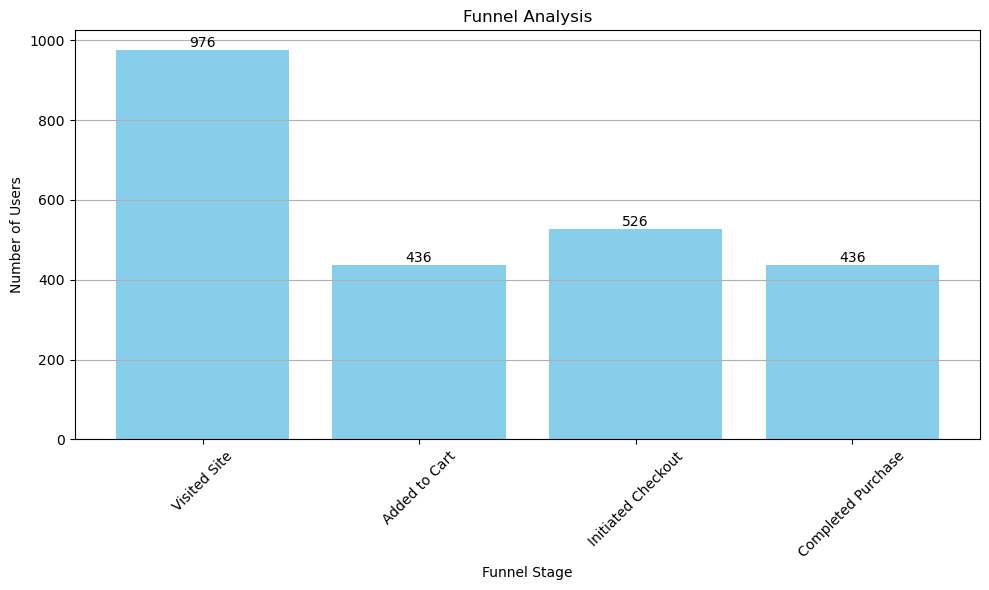

                Stage  Count  Conversion Rate
0        Visited Site    976         1.000000
1       Added to Cart    436         0.446721
2  Initiated Checkout    526         0.538934
3  Completed Purchase    436         0.446721


In [14]:
# Funnel Analysis

import matplotlib.pyplot as plt

# Define funnel stages
funnel_stages = {
    'Visited Site': len(df),  # Total number of consumers
    'Added to Cart': df['Purchase Frequency (per month)'][df['Purchase Frequency (per month)'] > 0].count(),
    'Initiated Checkout': df[df['Avg Spend per Purchase ($)'] > 0].shape[0],
    'Completed Purchase': df[df['Purchase Frequency (per month)'] > 0].shape[0]
}

# Create a DataFrame for funnel analysis
funnel_df = pd.DataFrame(funnel_stages.items(), columns=['Stage', 'Count'])

# Calculate conversion rates
funnel_df['Conversion Rate'] = funnel_df['Count'] / funnel_df['Count'].max()

# Plotting the funnel
plt.figure(figsize=(10, 6))
plt.bar(funnel_df['Stage'], funnel_df['Count'], color='skyblue')
plt.title('Funnel Analysis')
plt.xlabel('Funnel Stage')
plt.ylabel('Number of Users')
plt.xticks(rotation=45)
plt.grid(axis='y')

# Add counts above bars
for i, v in enumerate(funnel_df['Count']):
    plt.text(i, v + 0.5, str(v), ha='center', va='bottom')

plt.tight_layout()
plt.show()

# Display the funnel DataFrame
print(funnel_df)


The funnel analysis can provide insights into where users drop off, it doesn't inherently explain why they drop
off at each stage. To gain deeper insights into the reasons behind user drop-off, we can incorporate a few strategies:

**Detailed Analysis of Each Stage**
Instead of just counting users in each stage, you can analyze additional metrics or attributes at each 
stage to identify potential issues. For example, we can look at:

-  Demographics: Are certain age groups or genders more likely to drop off at specific stages?
-  Feedback: Collect user feedback on why they did not proceed.
-  Purchase Intent: Examine the average purchase intent (e.g., frequency of visits) for users who dropped off.

**Segmentation Analysis**
Analyze the drop-off rates for different segments of your user base. 
For example, we can segment by:
- Gender
- Age Group
- Income Level
- Preferred Style or Brand
This will help us understand which segments are more likely to drop off.


**Comparative Analysis**
Compare users who converted with those who did not. Look for differences in behavior, such as:
- Average time spent on site
- Number of products viewed
- Engagement with marketing (e.g., email opens, clicks)


**User Experience Analysis**
Consider conducting user experience (UX) research to identify pain points in the buying process. 
This can include:
- A/B Testing: Test different versions of landing pages or checkout processes.
- Heatmaps: Use tools to visualize where users click or drop off on pages.
- User Surveys: Directly ask users about their experiences.

    
By breaking down the analysis further, we can better understand the reasons behind user drop-off 
and tailor strategies to improve conversion rates. Analyzing additional attributes and segmenting the data will
give you a clearer picture of user behavior throughout the funnel.

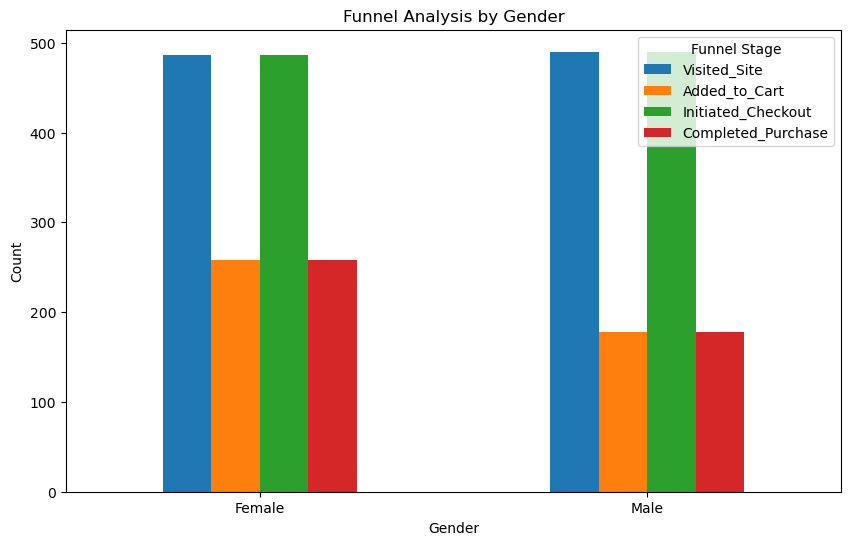

In [15]:
# Example: Deeper funnel analysis based on Gender

import pandas as pd
import matplotlib.pyplot as plt


# Calculate counts for each funnel stage by Gender
funnel_by_gender = df.groupby('Gender').agg(
    Visited_Site=('ID', 'count'),
    Added_to_Cart=('Purchase Frequency (per month)', lambda x: (x > 0).sum()),
    Initiated_Checkout=('Avg Spend per Purchase ($)', lambda x: (x > 0).count()),
    Completed_Purchase=('Purchase Frequency (per month)', lambda x: (x > 0).sum())
).reset_index()

# Calculate conversion rates
funnel_by_gender['Conversion_Rate_Added'] = funnel_by_gender['Added_to_Cart'] / funnel_by_gender['Visited_Site']
funnel_by_gender['Conversion_Rate_Checkout'] = funnel_by_gender['Initiated_Checkout'] / funnel_by_gender['Added_to_Cart']
funnel_by_gender['Conversion_Rate_Completed'] = funnel_by_gender['Completed_Purchase'] / funnel_by_gender['Initiated_Checkout']

# Visualization: Separate Bar Plots for Each Funnel Stage
funnel_stages = ['Visited_Site', 'Added_to_Cart', 'Initiated_Checkout', 'Completed_Purchase']
funnel_by_gender.set_index('Gender')[funnel_stages].plot(kind='bar', figsize=(10, 6))
plt.title('Funnel Analysis by Gender')
plt.ylabel('Count')
plt.xlabel('Gender')
plt.xticks(rotation=0)
plt.legend(title='Funnel Stage')
plt.show()



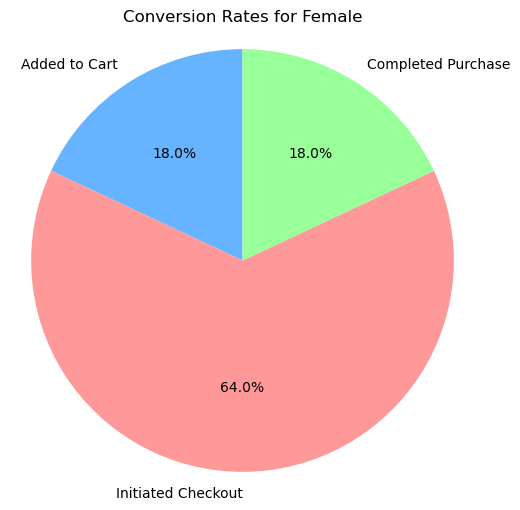

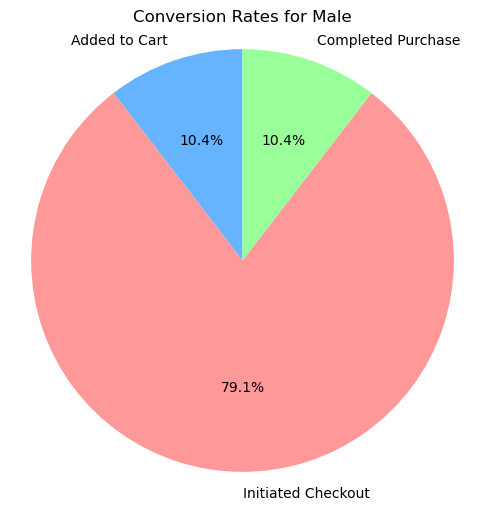

   Gender  Visited_Site  Added_to_Cart  Initiated_Checkout  \
0  Female           486            258                 486   
1    Male           490            178                 490   

   Completed_Purchase  Conversion_Rate_Added  Conversion_Rate_Checkout  \
0                 258               0.530864                  1.883721   
1                 178               0.363265                  2.752809   

   Conversion_Rate_Completed  
0                   0.530864  
1                   0.363265  


In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

# Calculate counts for each funnel stage by Gender
funnel_by_gender = df.groupby('Gender').agg(
    Visited_Site=('ID', 'count'),
    Added_to_Cart=('Purchase Frequency (per month)', lambda x: (x > 0).sum()),
    Initiated_Checkout=('Avg Spend per Purchase ($)', lambda x: (x > 0).count()),
    Completed_Purchase=('Purchase Frequency (per month)', lambda x: (x > 0).sum())
).reset_index()

# Calculate conversion rates
funnel_by_gender['Conversion_Rate_Added'] = funnel_by_gender['Added_to_Cart'] / funnel_by_gender['Visited_Site']
funnel_by_gender['Conversion_Rate_Checkout'] = funnel_by_gender['Initiated_Checkout'] / funnel_by_gender['Added_to_Cart']
funnel_by_gender['Conversion_Rate_Completed'] = funnel_by_gender['Completed_Purchase'] / funnel_by_gender['Initiated_Checkout']

# Visualization 1: Funnel Chart for Conversion Rates using Plotly
funnel_data = funnel_by_gender.melt(id_vars='Gender', 
    value_vars=['Conversion_Rate_Added', 'Conversion_Rate_Checkout', 'Conversion_Rate_Completed'],
    var_name='Funnel_Stage', value_name='Conversion_Rate')

# Create a funnel chart for each gender
for gender in funnel_data['Gender'].unique():
    data_gender = funnel_data[funnel_data['Gender'] == gender]
    fig = px.funnel(data_gender, y='Funnel_Stage', x='Conversion_Rate', title=f'Conversion Funnel for {gender}')
    fig.show()

# Visualization 2: Pie Charts for Conversion Rates by Gender
# Example for Gender-based Pie Chart for Completed Purchase Conversion Rates
for gender in funnel_by_gender['Gender']:
    values = funnel_by_gender[funnel_by_gender['Gender'] == gender][['Conversion_Rate_Added', 'Conversion_Rate_Checkout', 'Conversion_Rate_Completed']].values[0]
    labels = ['Added to Cart', 'Initiated Checkout', 'Completed Purchase']
    
    plt.figure(figsize=(6, 6))
    plt.pie(values, labels=labels, autopct='%1.1f%%', startangle=90, colors=['#66b3ff', '#ff9999', '#99ff99'])
    plt.title(f'Conversion Rates for {gender}')
    plt.axis('equal')  # Equal aspect ratio ensures the pie chart is a circle.
    plt.show()

# Display the detailed funnel by gender
print(funnel_by_gender)


### Exploratory Data Analysis (EDA)

Exploratory Data Analysis (EDA) is an approach to analyzing datasets to summarize their main characteristics, often with visual methods. It is a critical step in the data analysis process that helps to understand the data better before applying more formal statistical methods or machine learning techniques. The main goals of EDA are to:

1. **Gain Insights**: Identify patterns, trends, and relationships within the data.
2. **Detect Anomalies**: Spot outliers or anomalies that might skew results or indicate data quality issues.
3. **Understand Data Structure**: Get a sense of the data's distribution, variance, and relationships between variables.
4. **Formulate Hypotheses**: Generate hypotheses for further testing based on observed patterns.

#### Components of EDA

EDA encompasses a variety of analyses and techniques, including:

1. **Descriptive Statistics**:
   - **Mean, Median, Mode**: Measures of central tendency.
   - **Standard Deviation, Variance**: Measures of variability.
   - **Skewness and Kurtosis**: Assessing the shape of data distributions.

2. **Data Visualization**:
   - **Histograms**: Visualize the distribution of a single variable.
   - **Box Plots**: Display the distribution and identify outliers.
   - **Scatter Plots**: Show relationships between two continuous variables.
   - **Bar Charts**: Compare categorical variables.
   - **Heatmaps**: Visualize correlation matrices or frequency distributions.

3. **Univariate Analysis**:
   - Analyzing a single variable to understand its distribution and characteristics.

4. **Bivariate Analysis**:
   - Examining the relationship between two variables to identify correlations or patterns.

5. **Multivariate Analysis**:
   - Investigating interactions between multiple variables, often using techniques like PCA (Principal Component Analysis) or clustering.

6. **Missing Value Analysis**:
   - Identifying and handling missing data, whether through imputation, deletion, or analysis of patterns of missingness.

7. **Outlier Detection**:
   - Identifying data points that deviate significantly from other observations, which may need special attention.

8. **Feature Engineering**:
   - Creating new features based on existing data to improve model performance.

### Importance of EDA

- **Informs Model Selection**: Understanding the data helps in choosing appropriate models and techniques.
- **Enhances Data Quality**: Identifying issues like missing values or outliers improves the dataset's overall quality.
- **Guides Further Analysis**: EDA can suggest directions for further analysis or more sophisticated statistical methods.

Overall, EDA is a foundational step in data analysis, providing a comprehensive understanding of the data before diving into more complex analyses or predictive modeling.

### Univariate Analysis ###
Summary Statistics:
         Income ($)  Purchase Frequency (per month)  \
count  9.760000e+02                    9.760000e+02   
mean  -2.329648e-16                    1.274026e-16   
min   -1.778798e+00                   -1.109663e+00   
25%   -1.289059e+00                   -1.109663e+00   
50%    4.815371e-01                   -4.163011e-01   
75%    8.582596e-01                    9.704221e-01   
max    1.234982e+00                    1.663784e+00   
std    1.000513e+00                    1.000513e+00   

       Avg Spend per Purchase ($)  Return Rate (%)  Satisfaction Rating (1-5)  \
count                9.760000e+02       976.000000                 976.000000   
mean                 2.912060e-17         4.628074                   4.521311   
min                 -1.505264e+00         0.000000                   4.000000   
25%                 -1.010149e+00         3.000000                   4.200000   
50%                  2.276378e-01         5.000000 

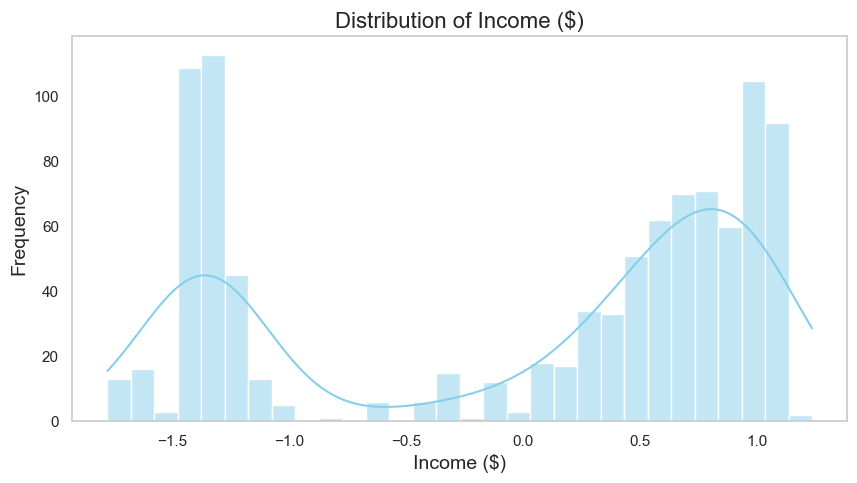

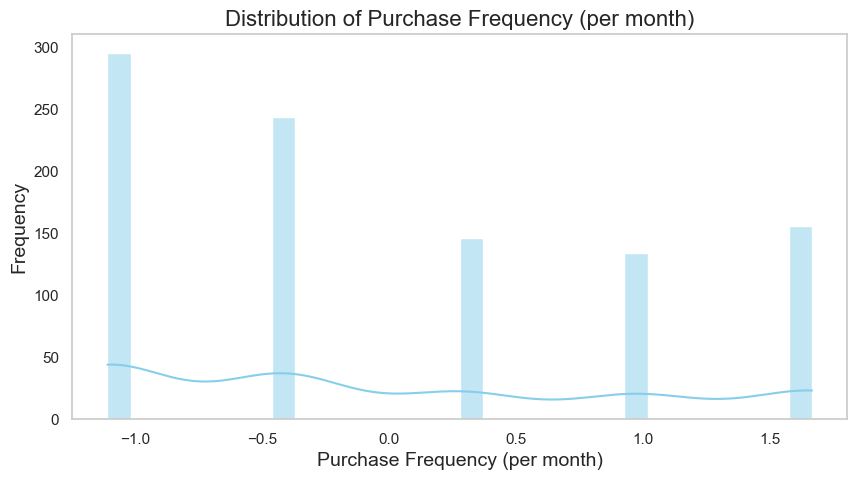

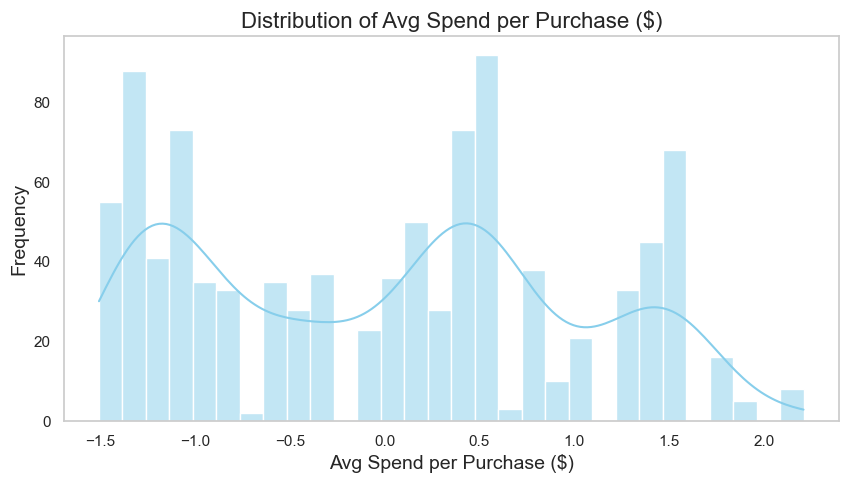

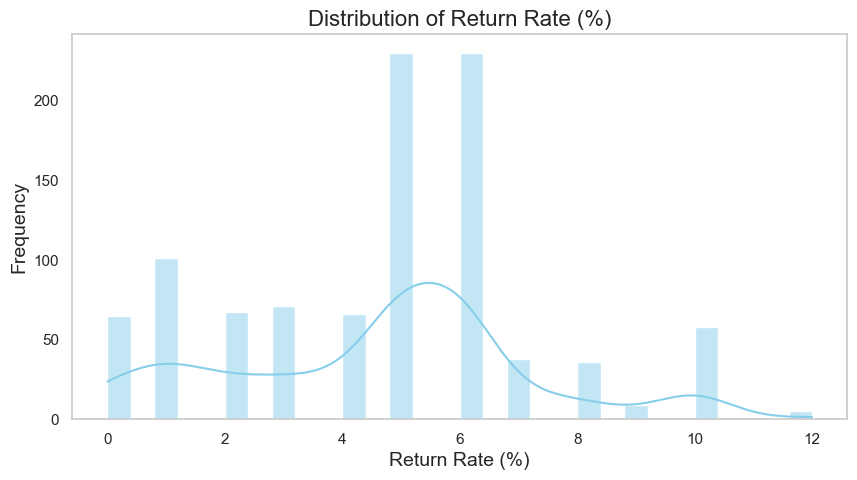

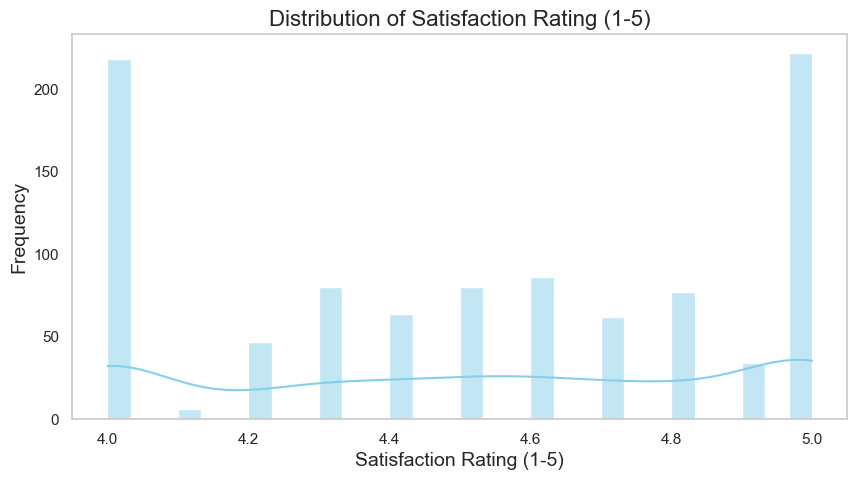

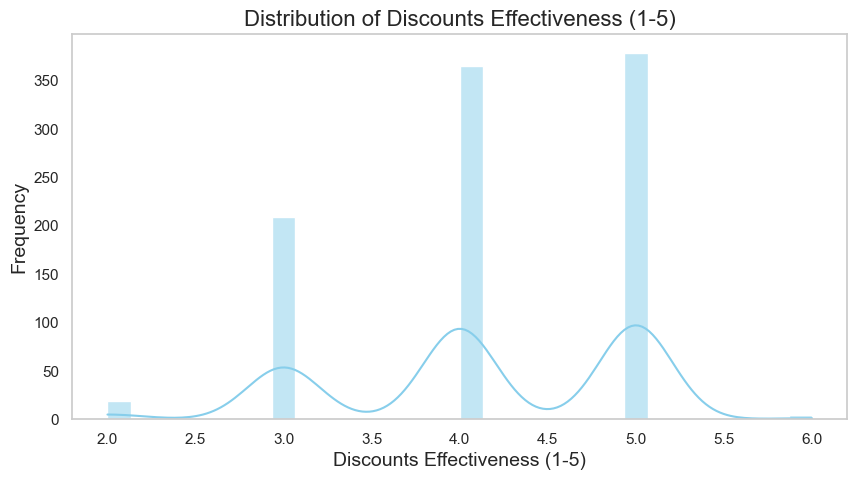

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:38: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




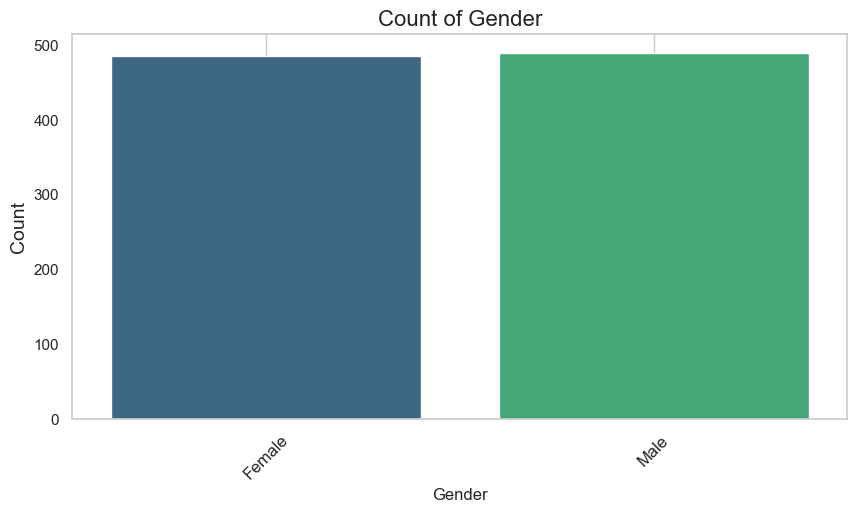

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:38: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




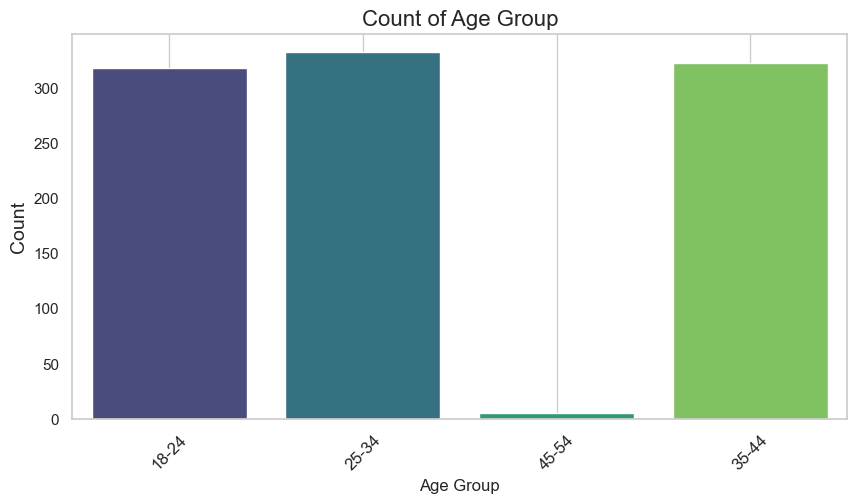

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:38: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




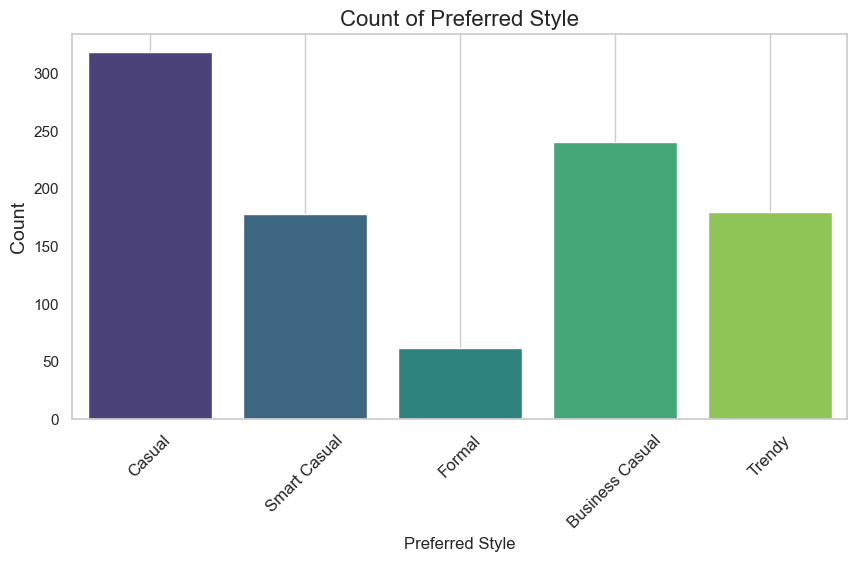

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:38: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




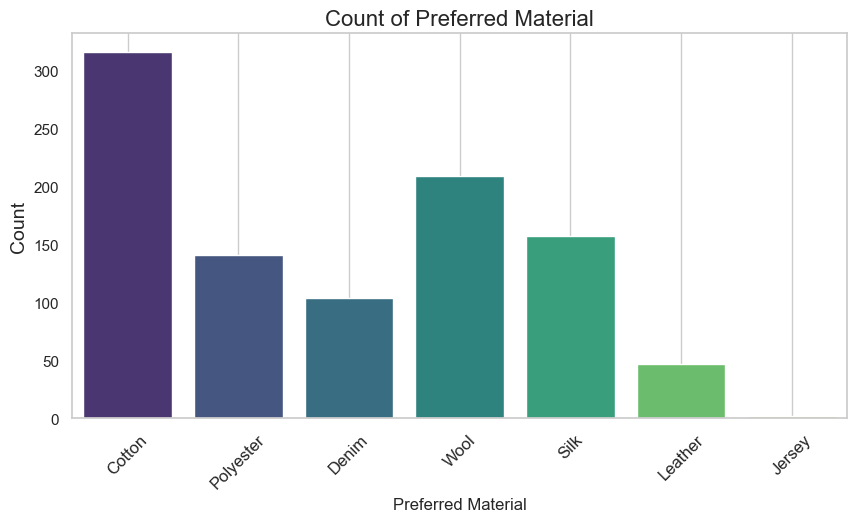

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:38: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




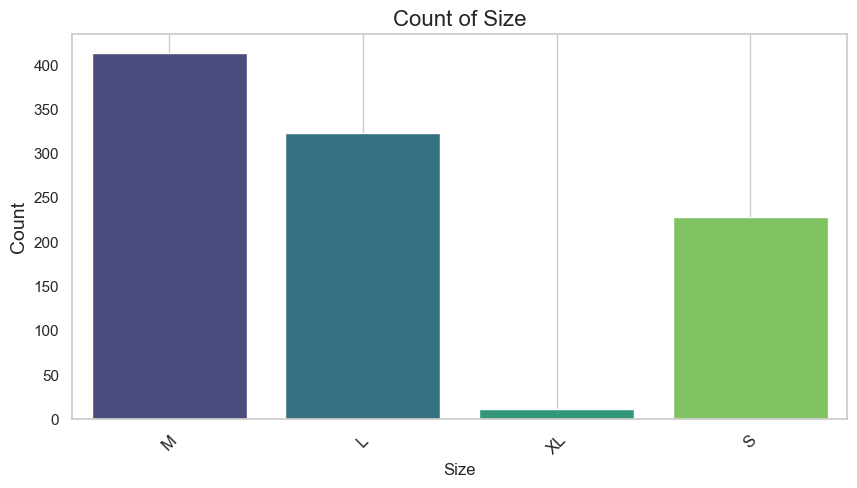

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:38: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




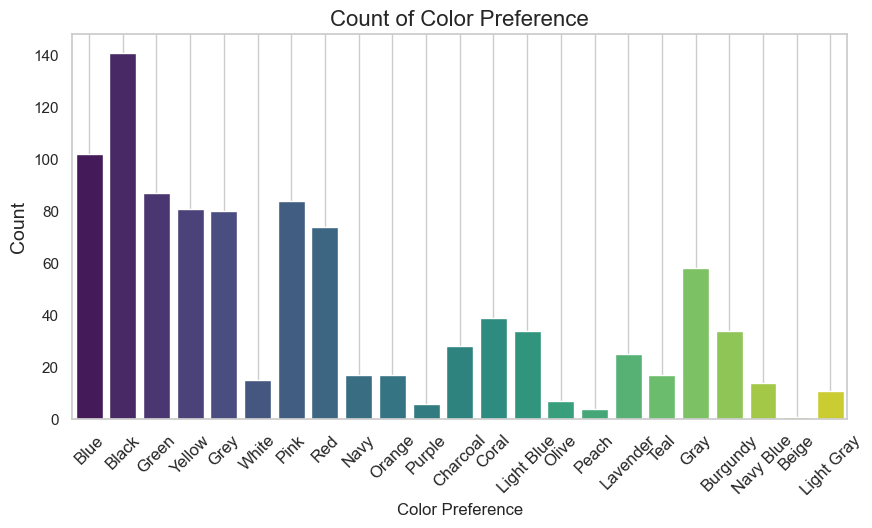

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:38: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




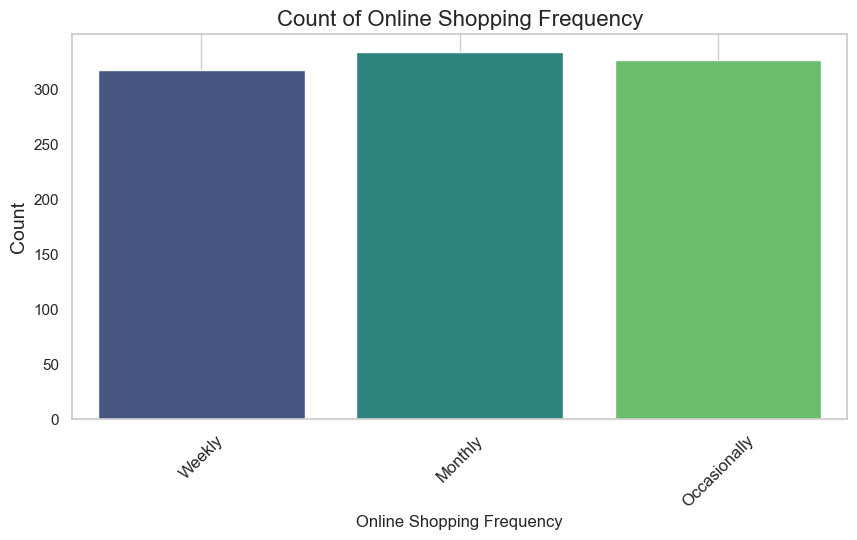

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:38: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




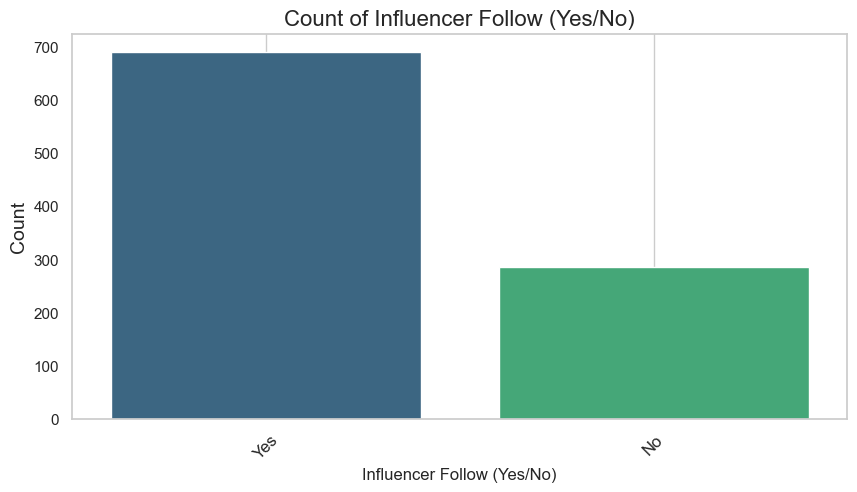

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:38: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




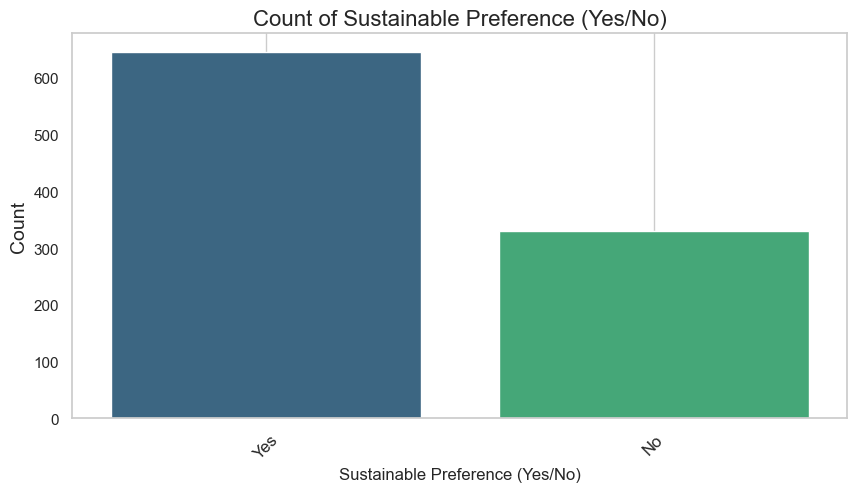

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:38: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




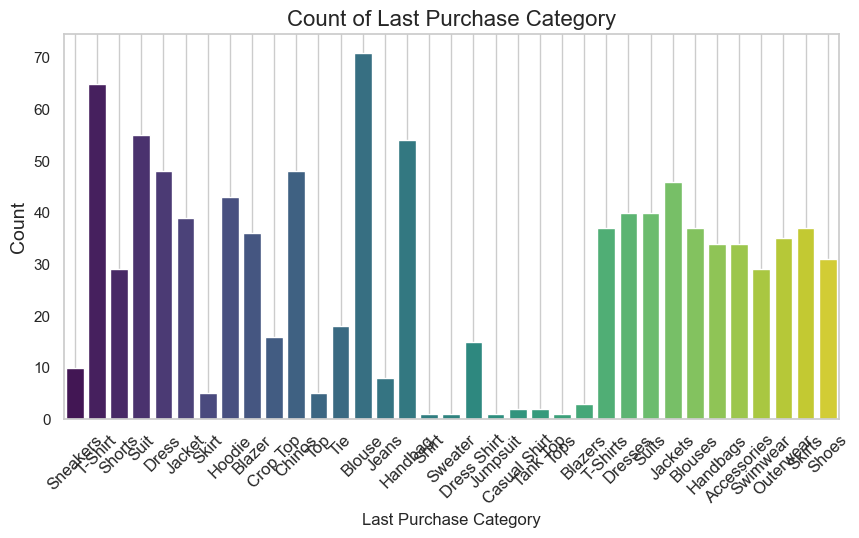

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:38: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




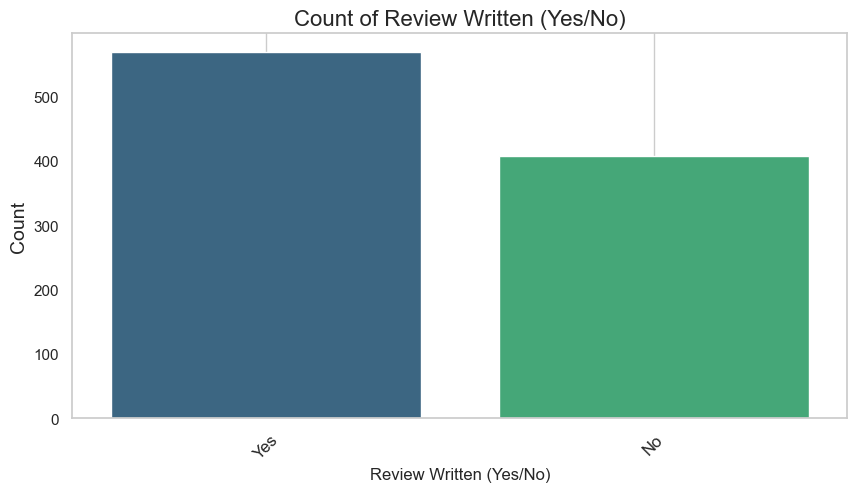

### Bivariate Analysis ###


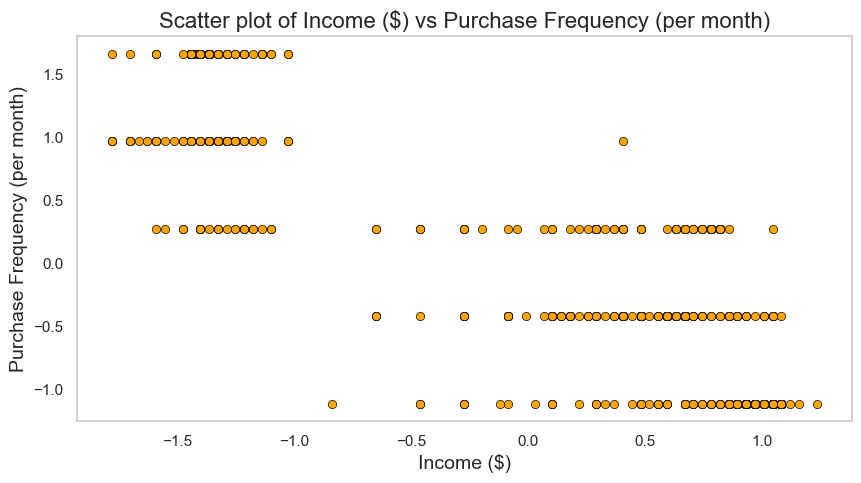

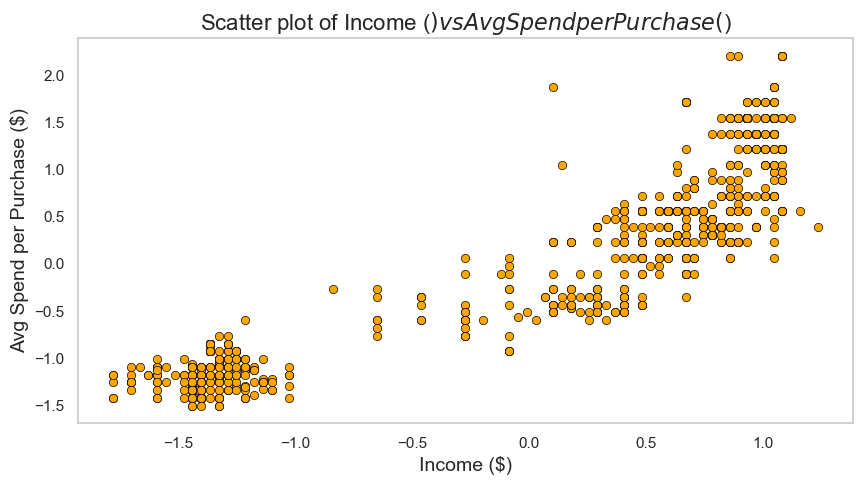

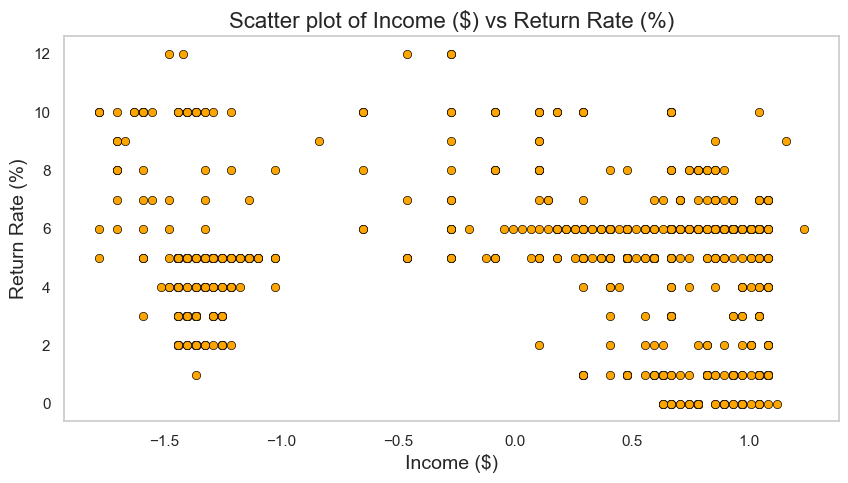

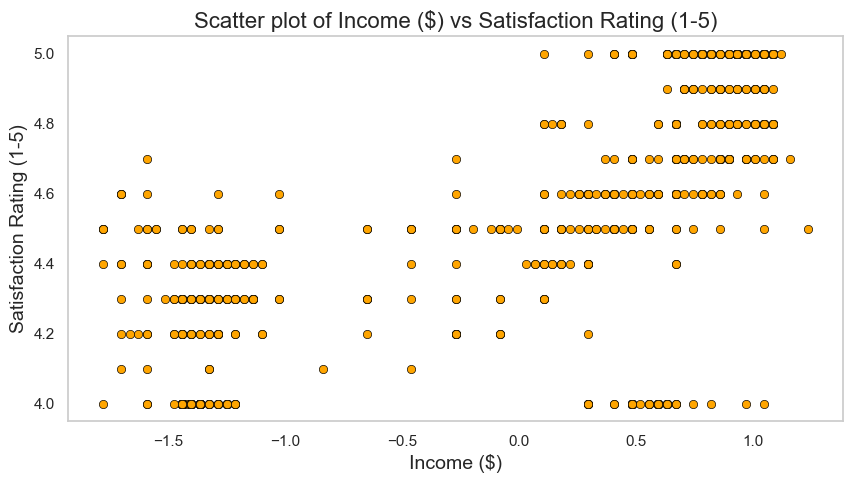

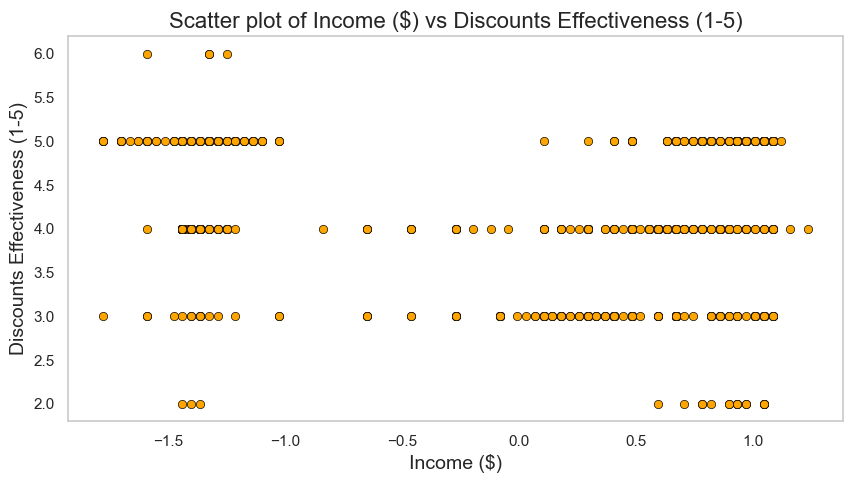

...

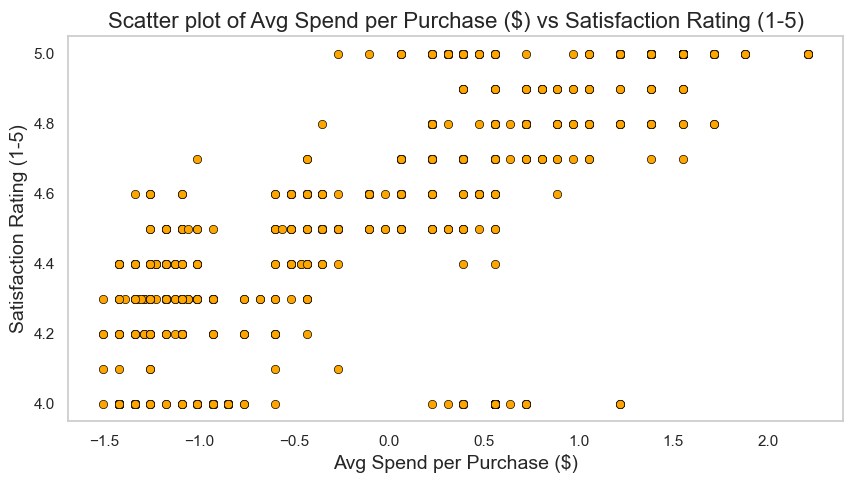

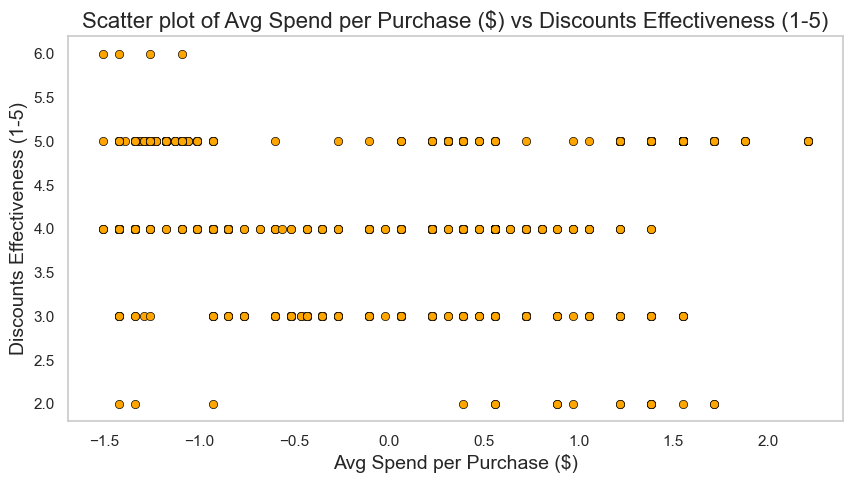

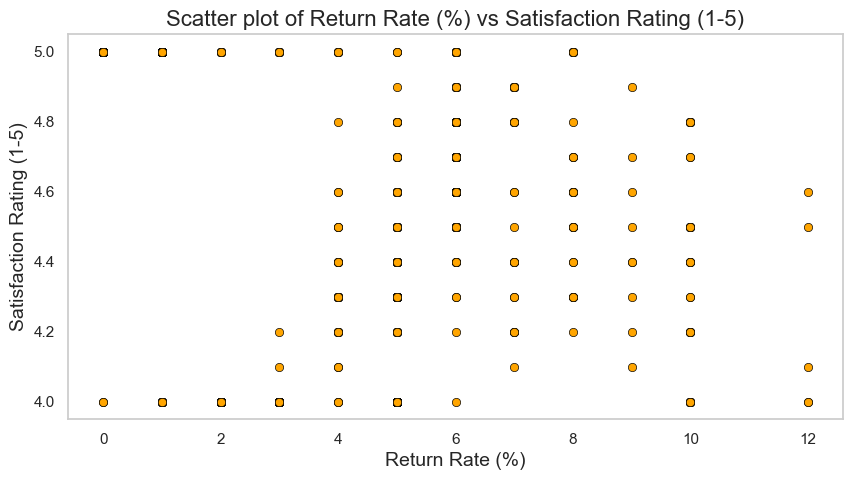

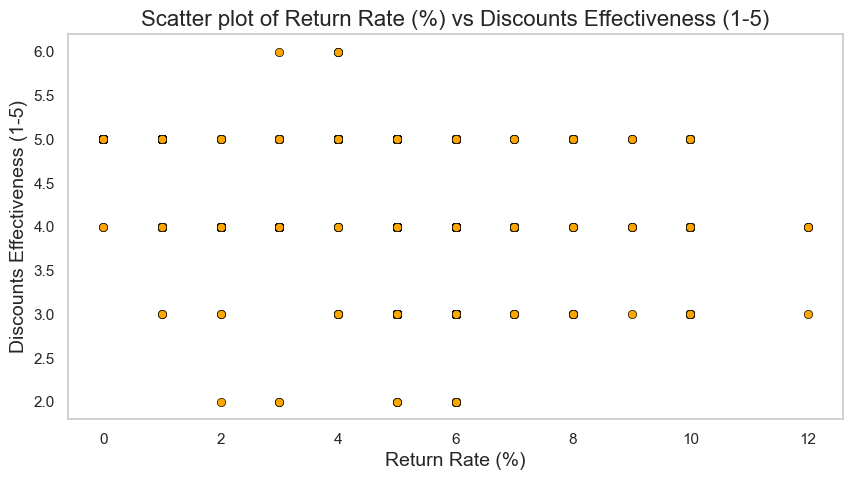

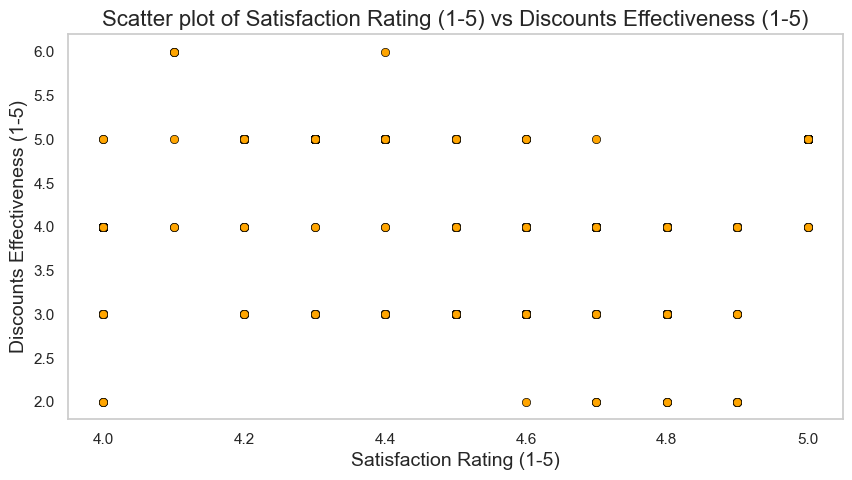

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




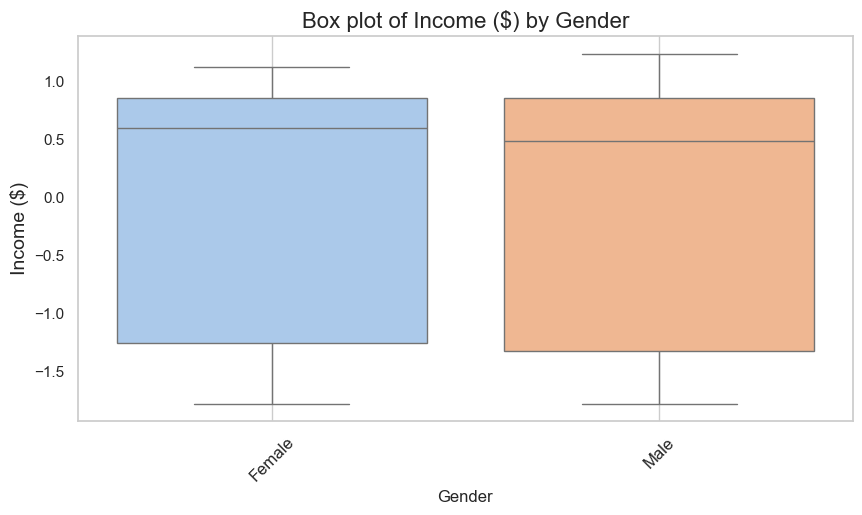

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




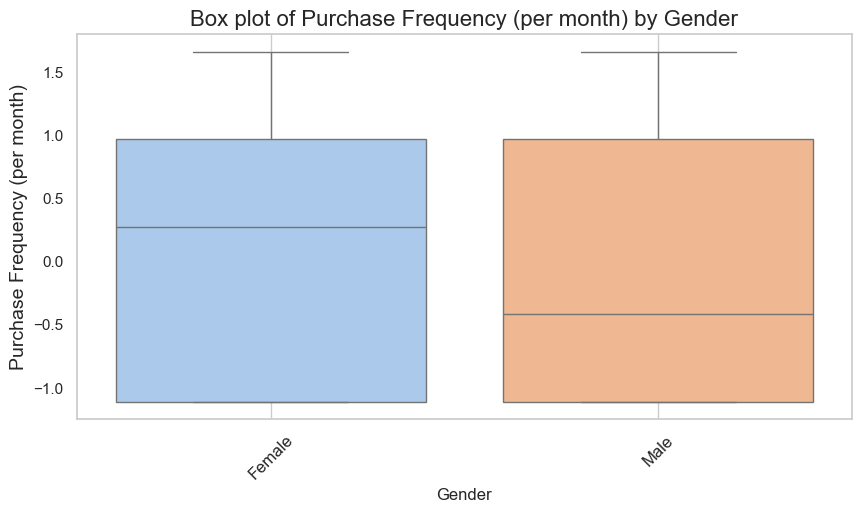

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




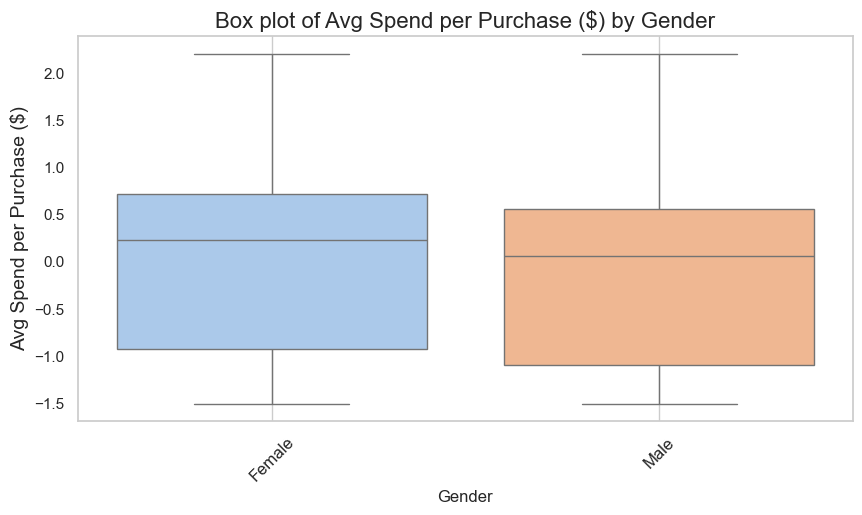

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




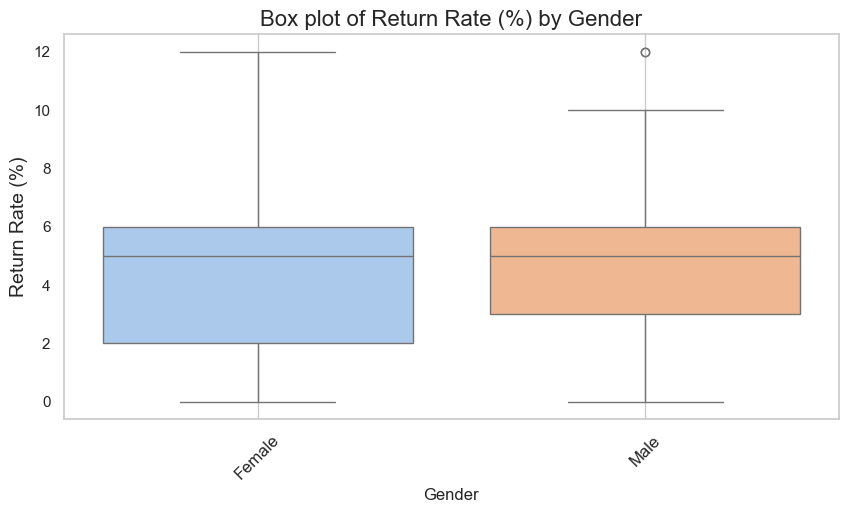

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




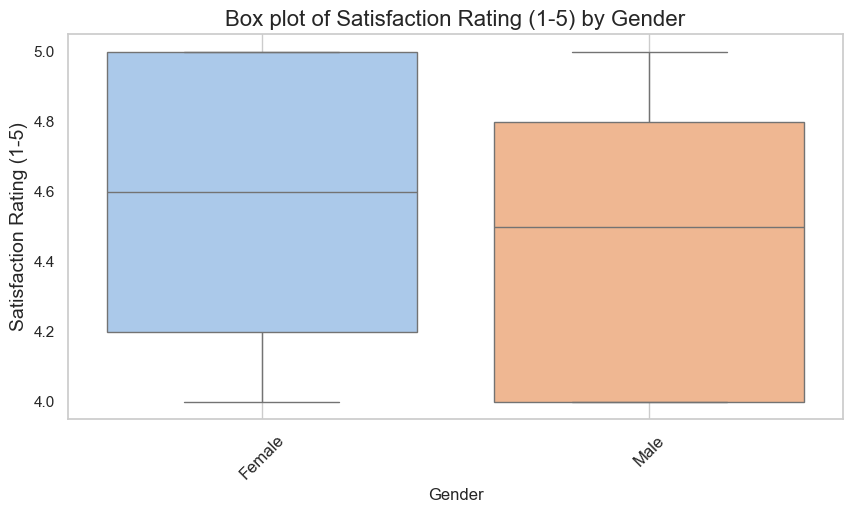

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




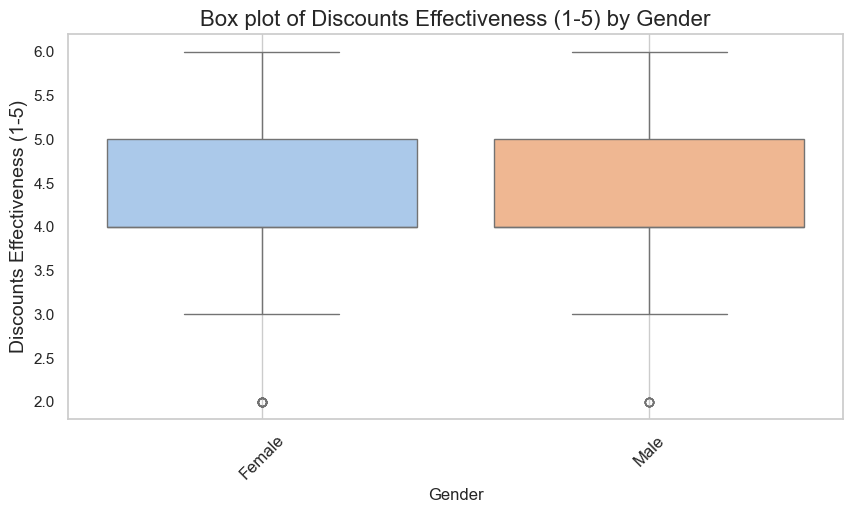

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




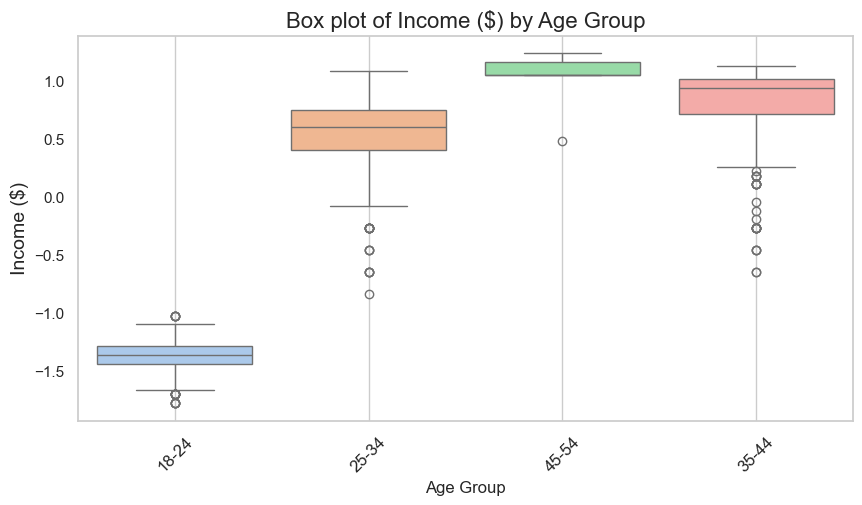

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




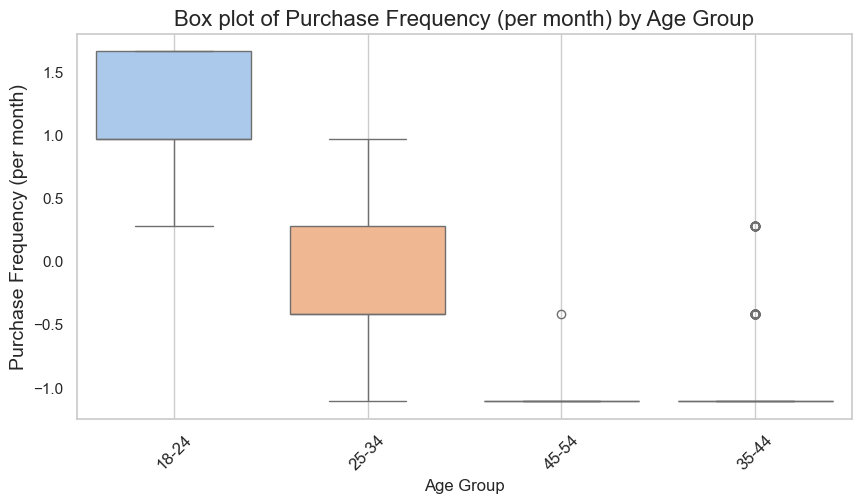

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




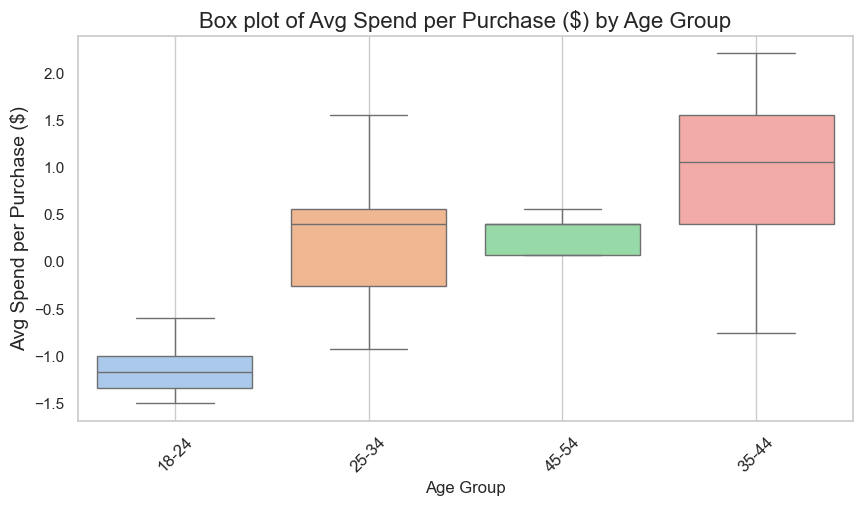

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




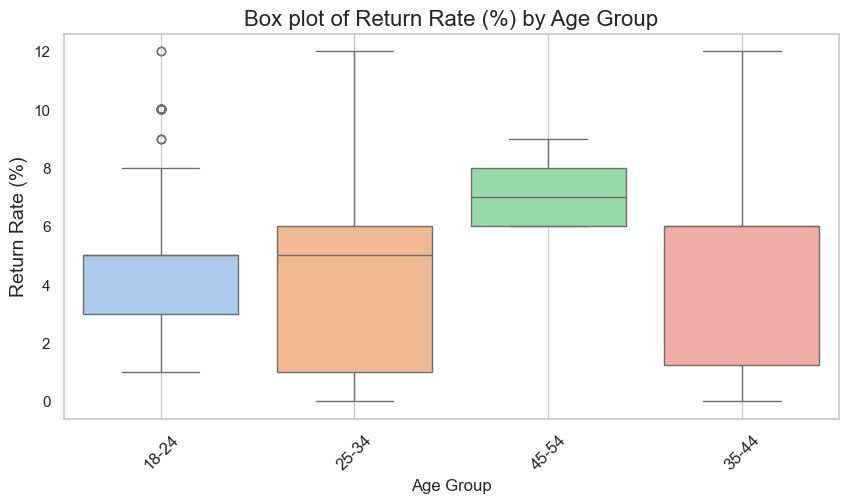

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




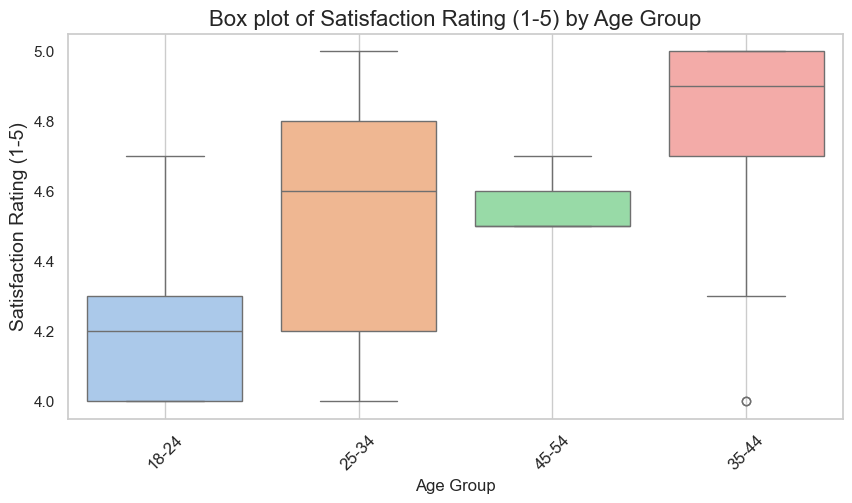

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




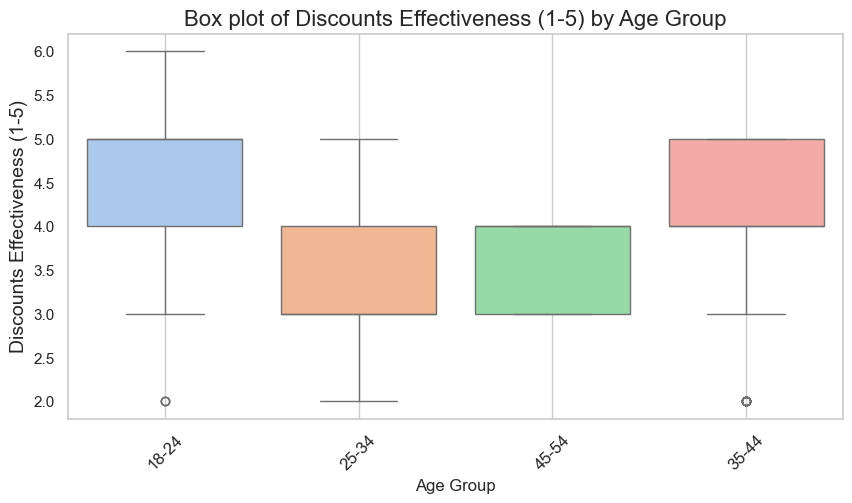

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




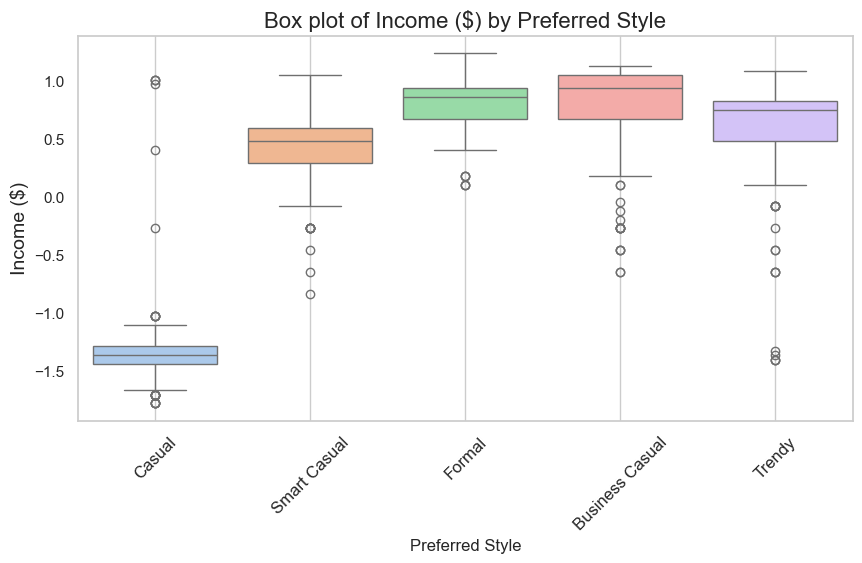

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




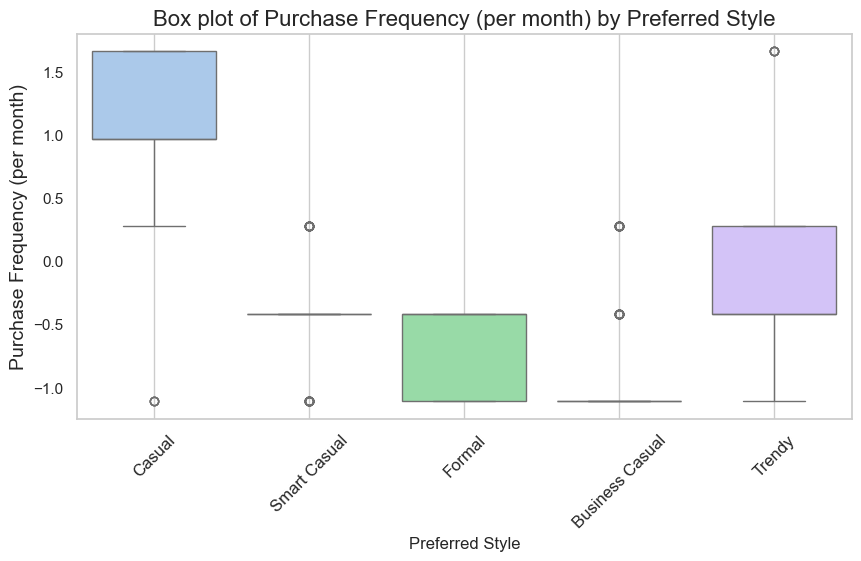

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




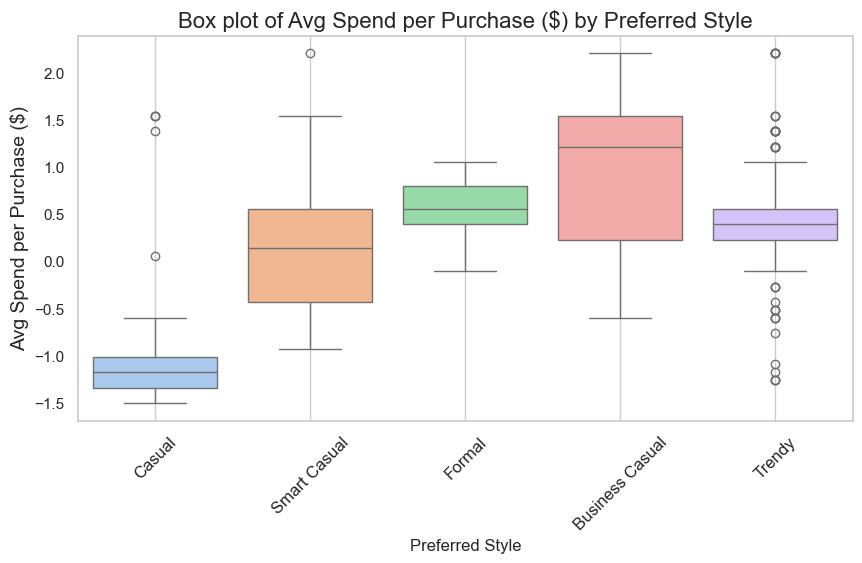

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




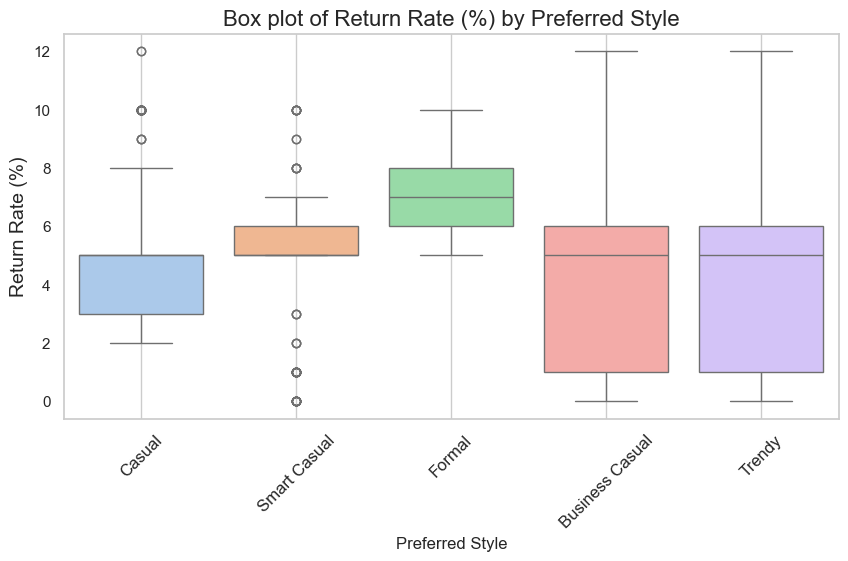

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




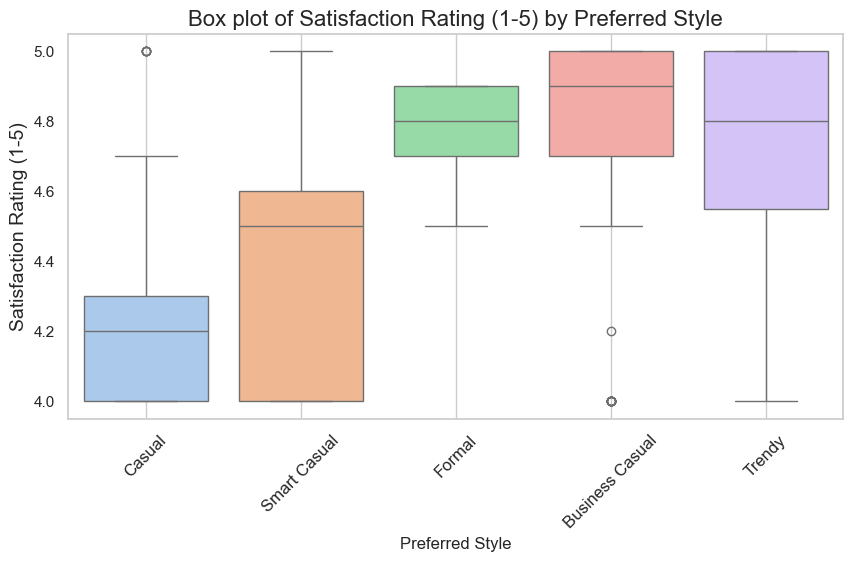

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




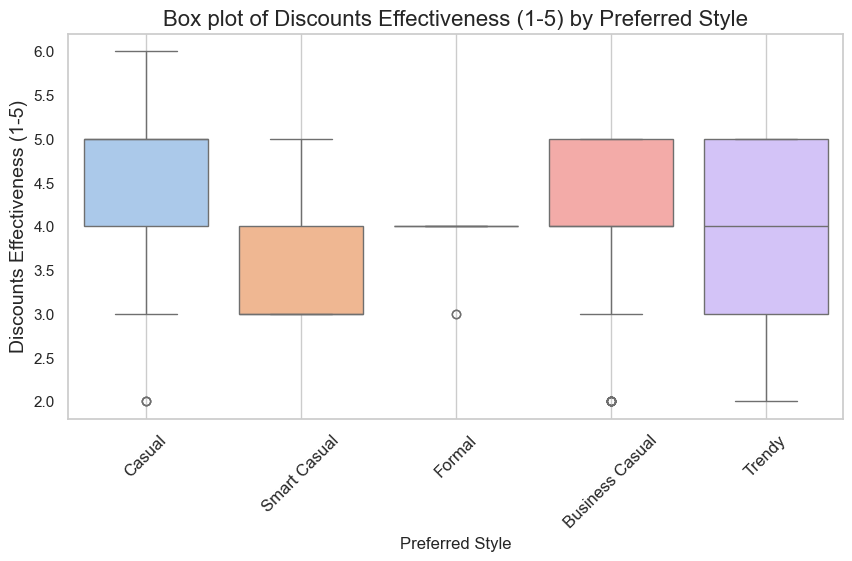

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




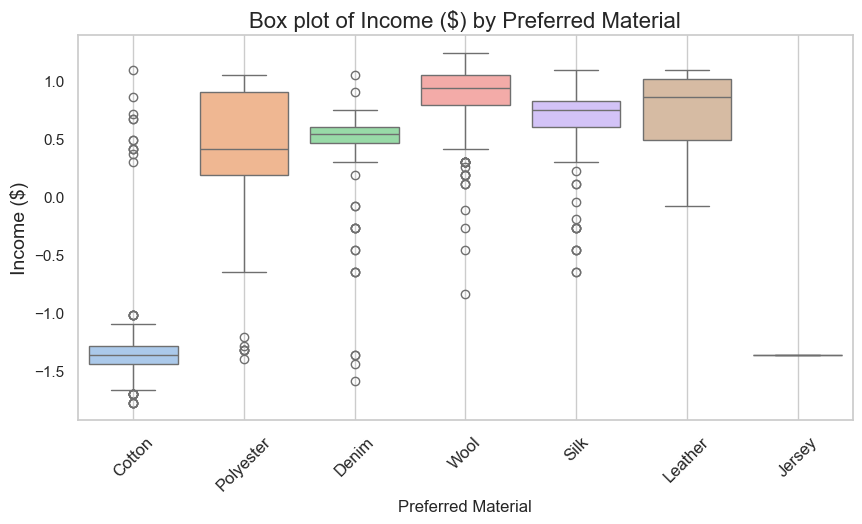

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




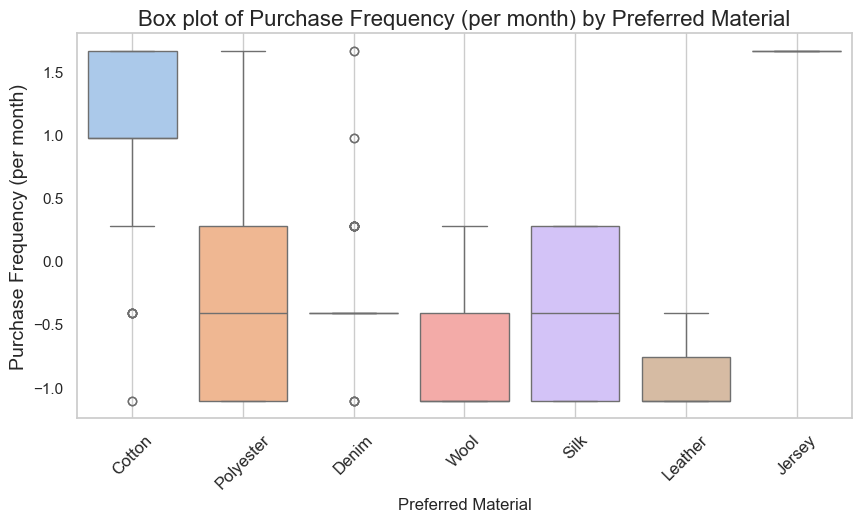

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




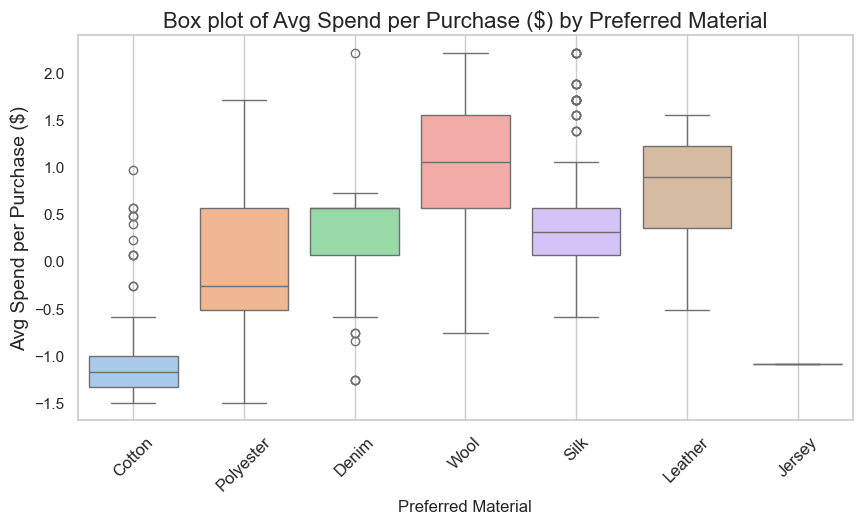

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




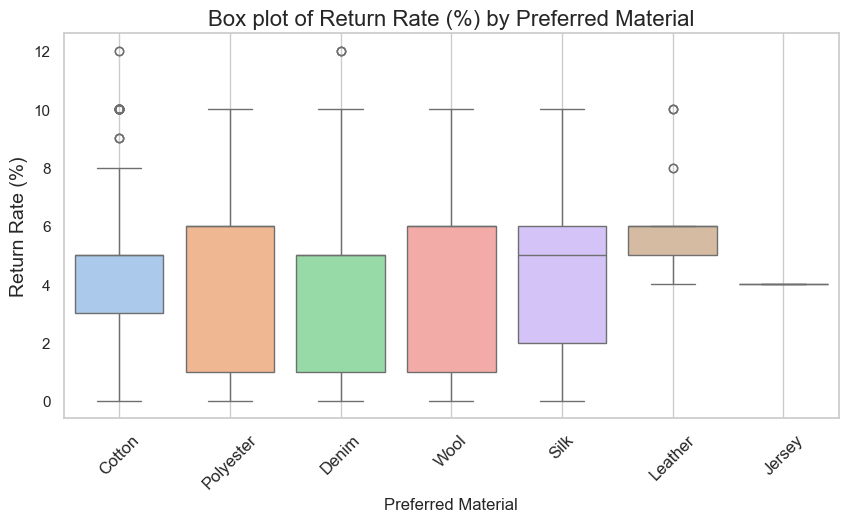

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




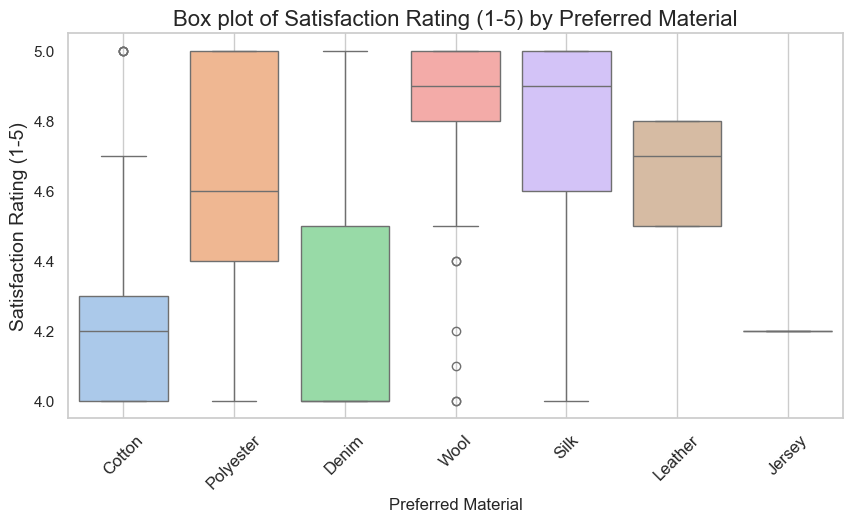

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




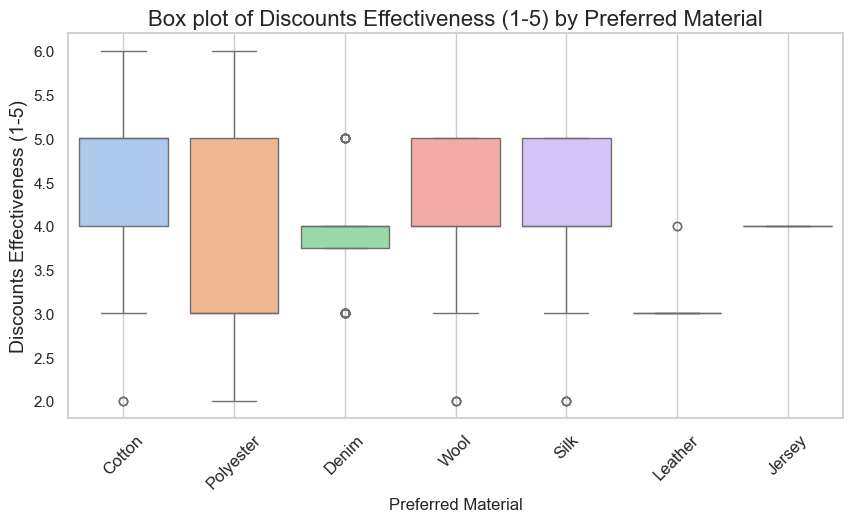

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




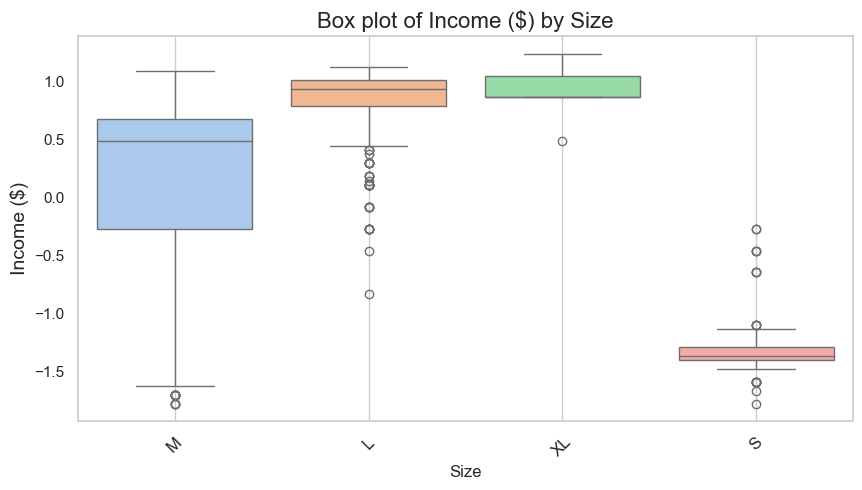

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




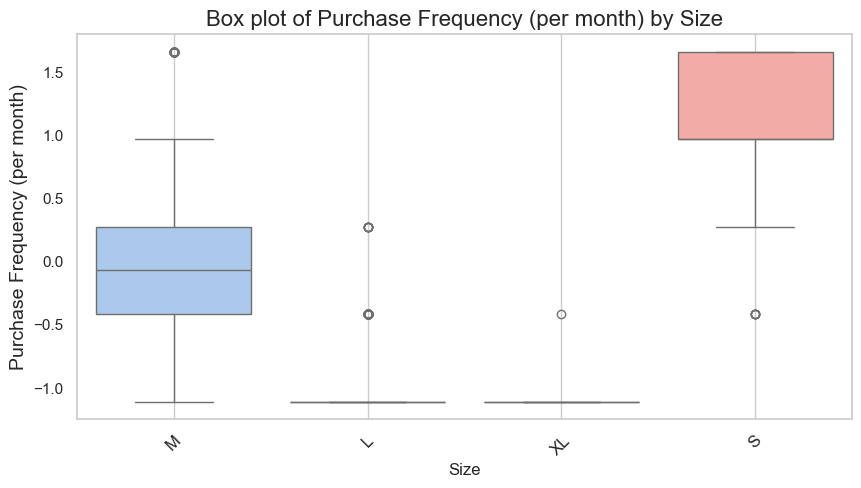

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




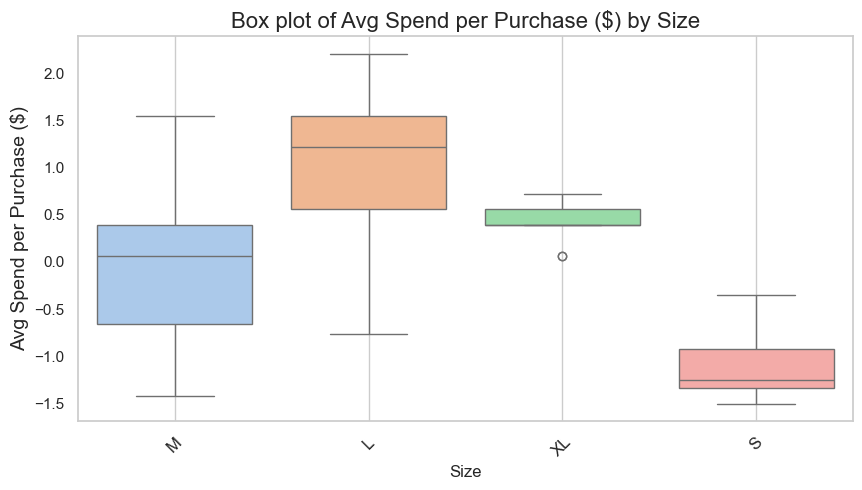

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




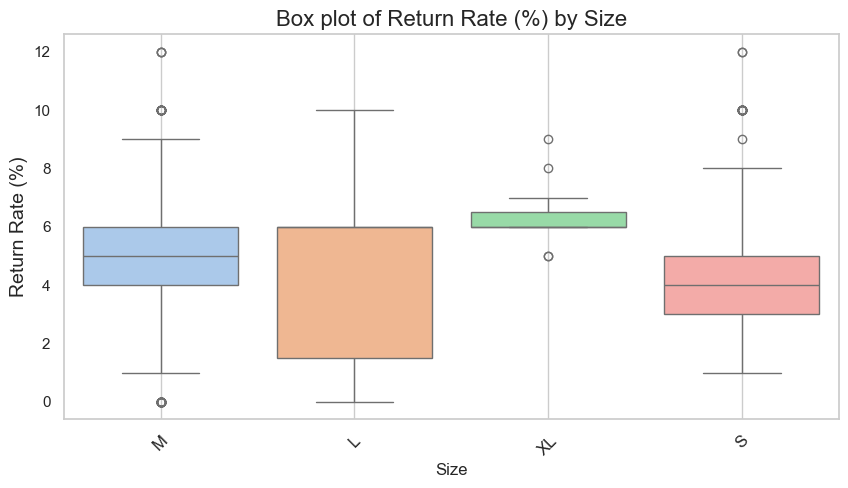

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




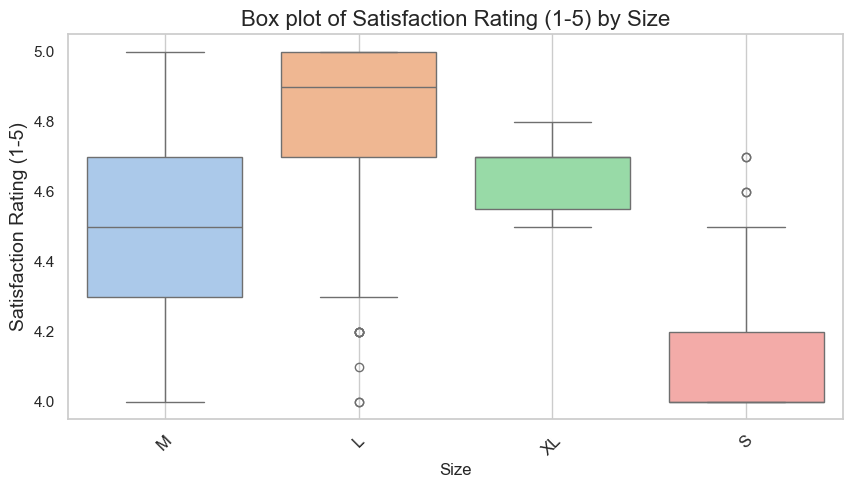

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




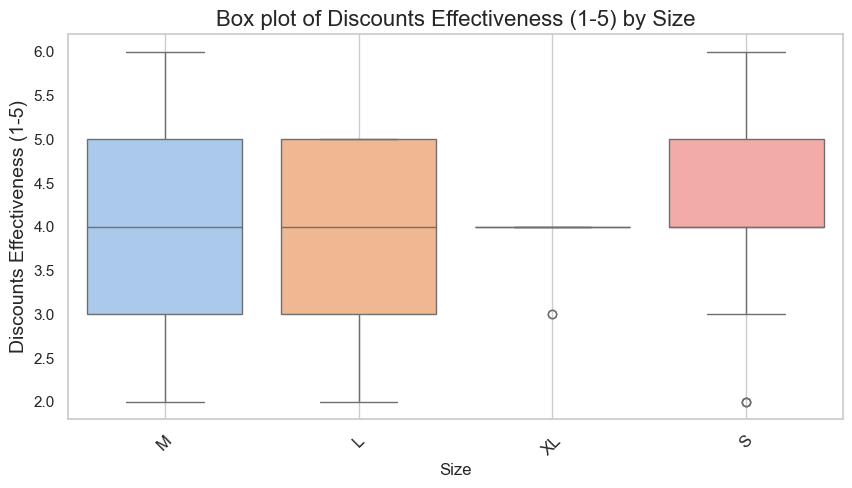

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




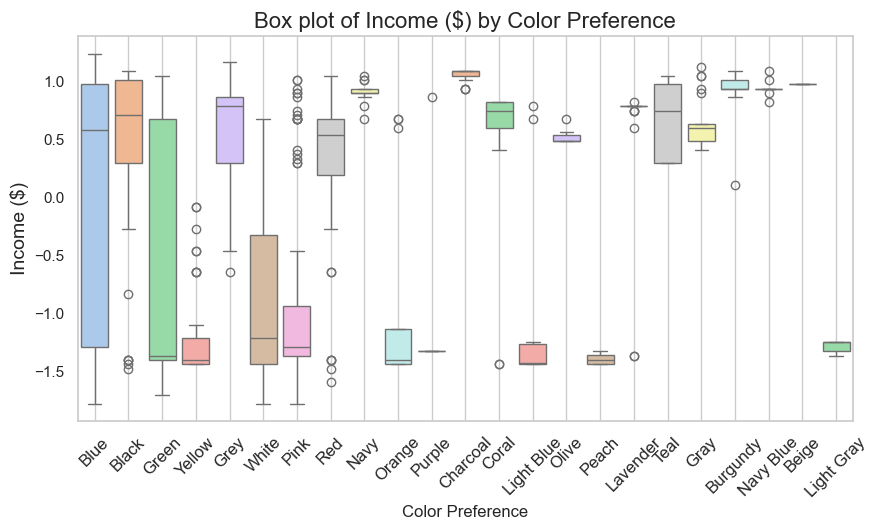

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




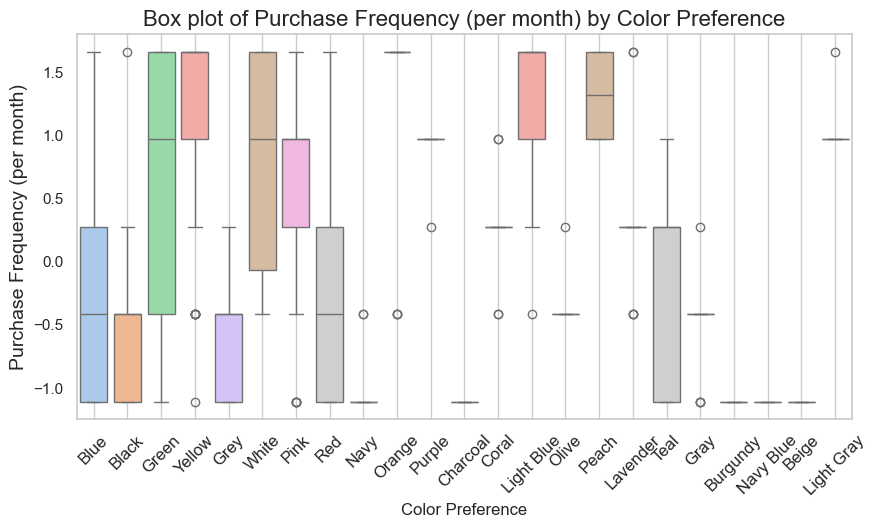

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




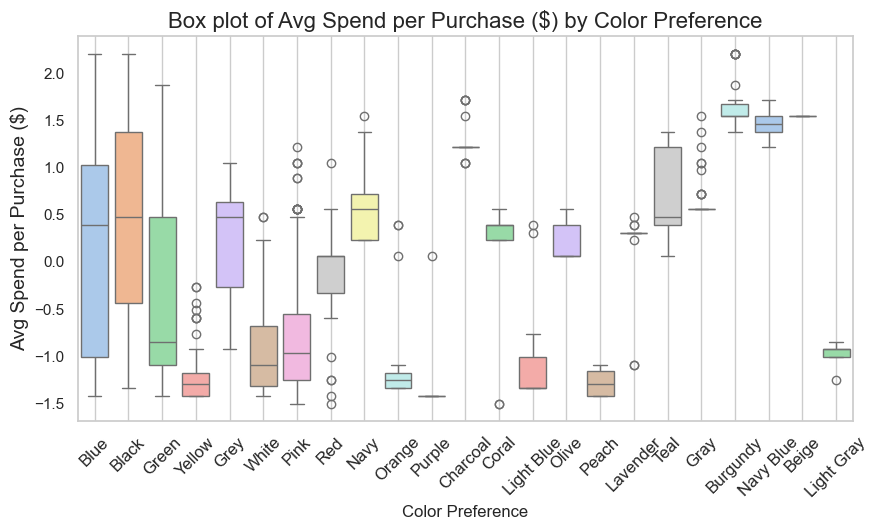

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




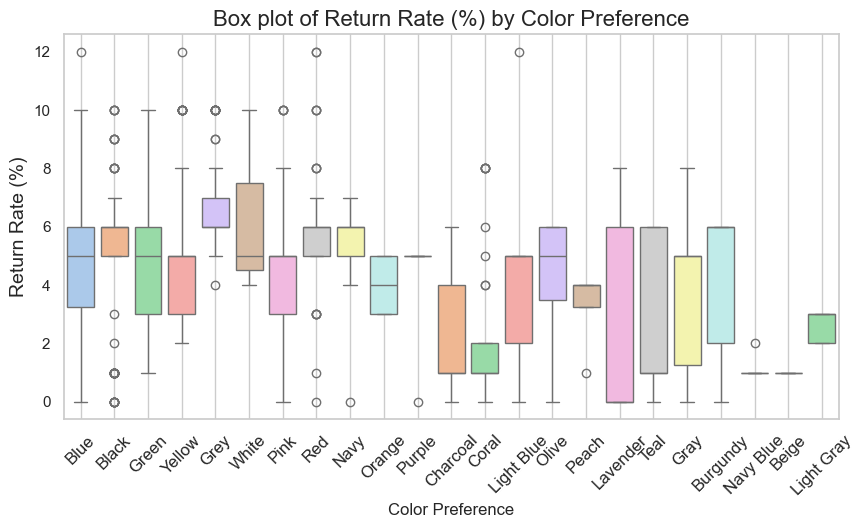

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




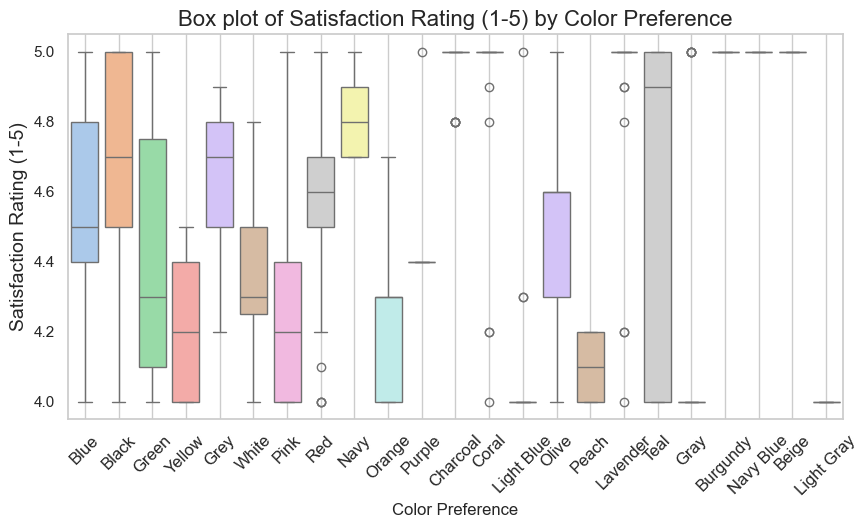

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




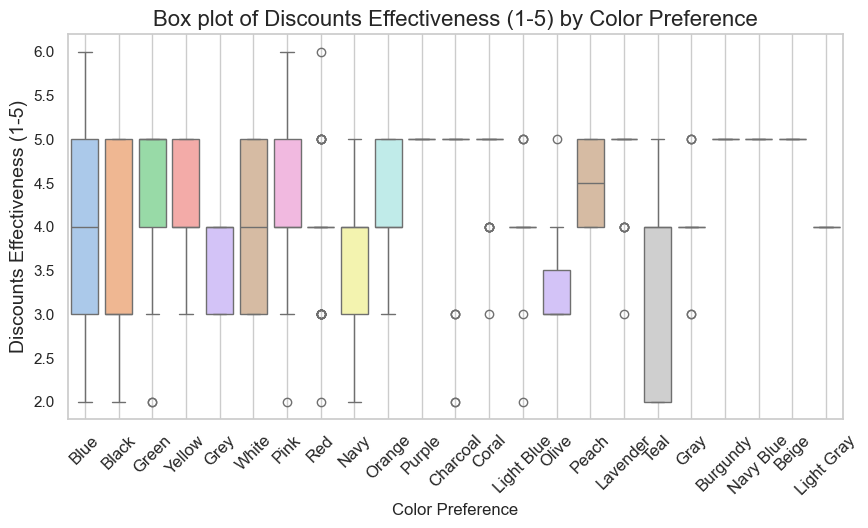

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




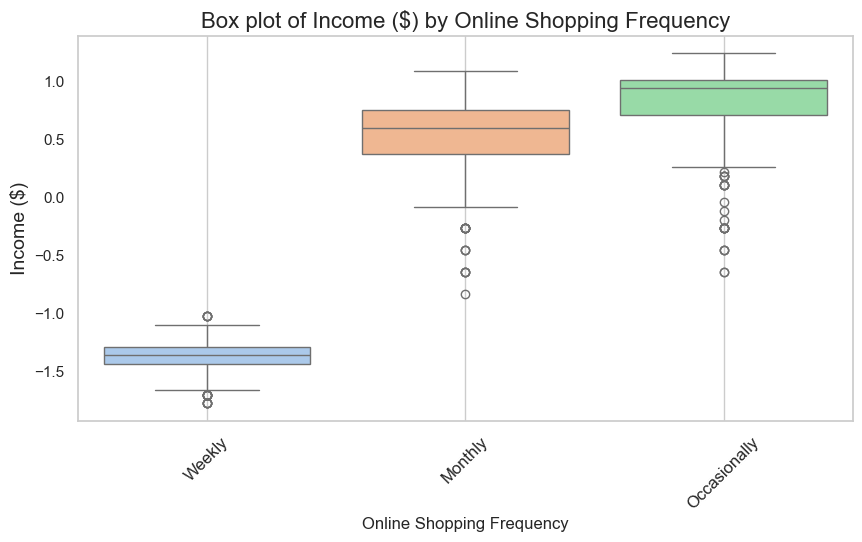

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




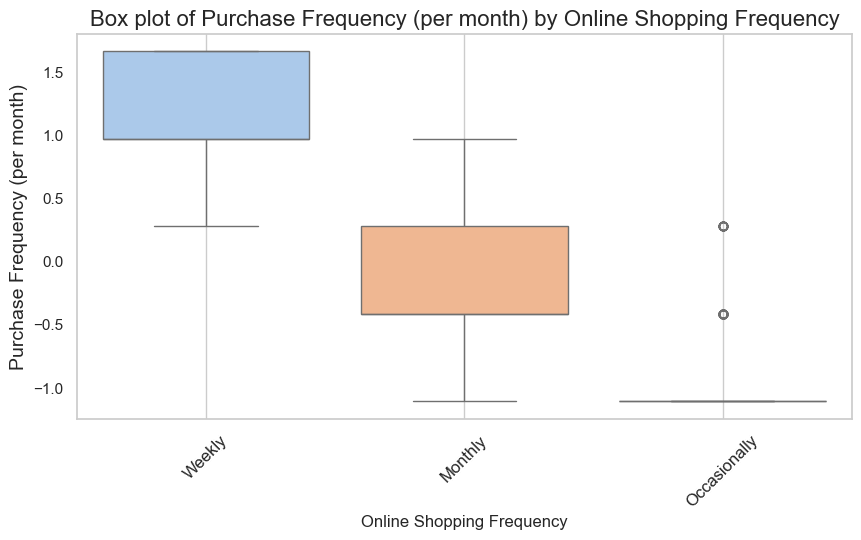

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




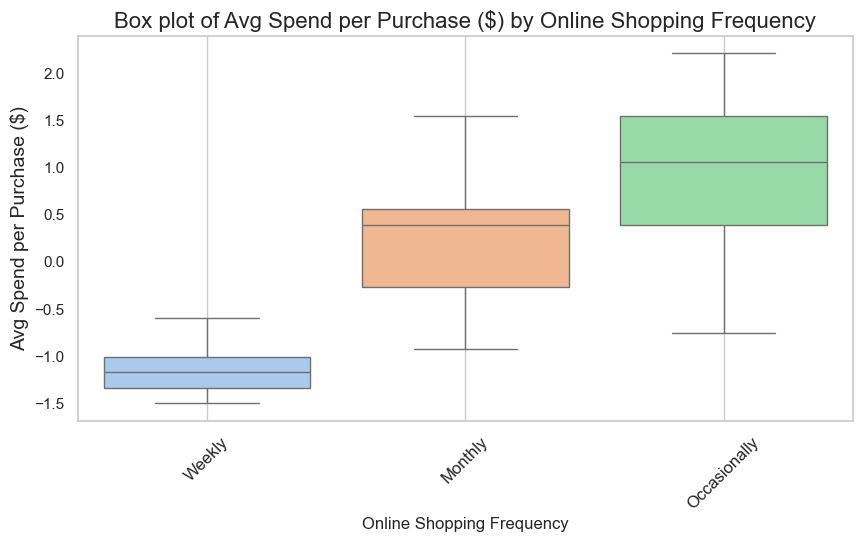

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




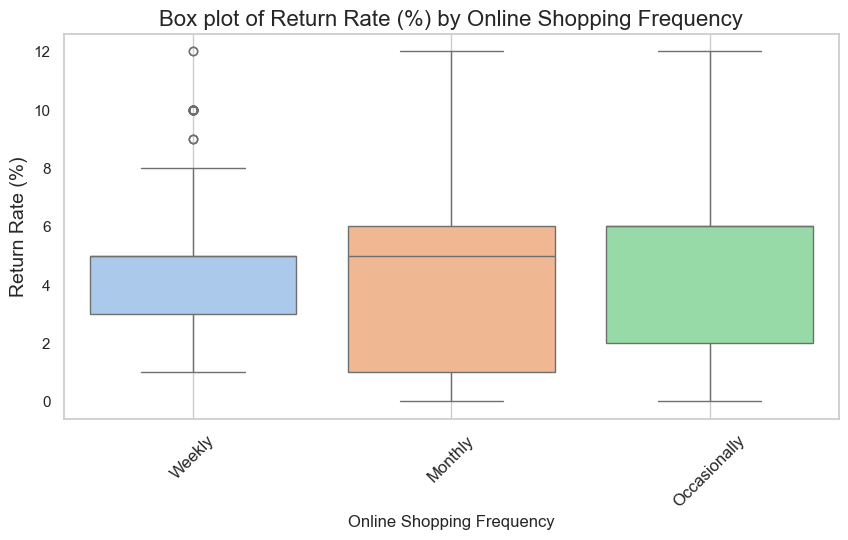

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




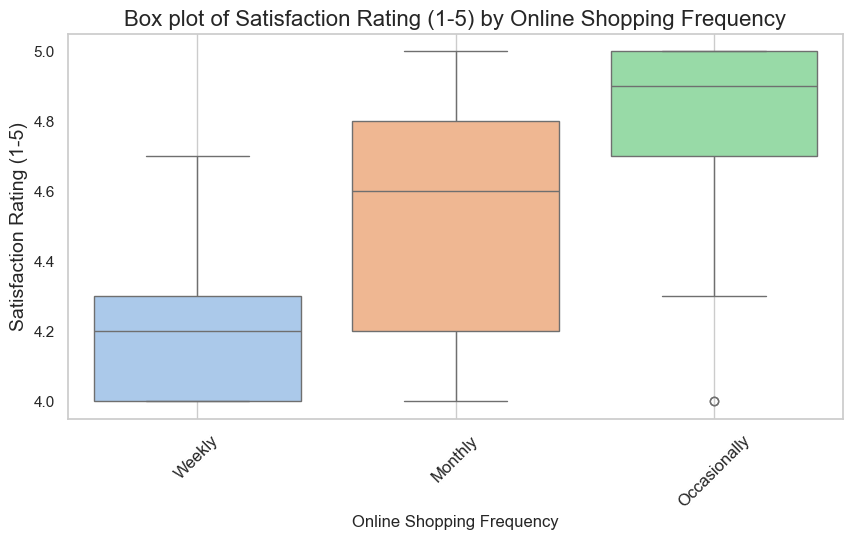

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




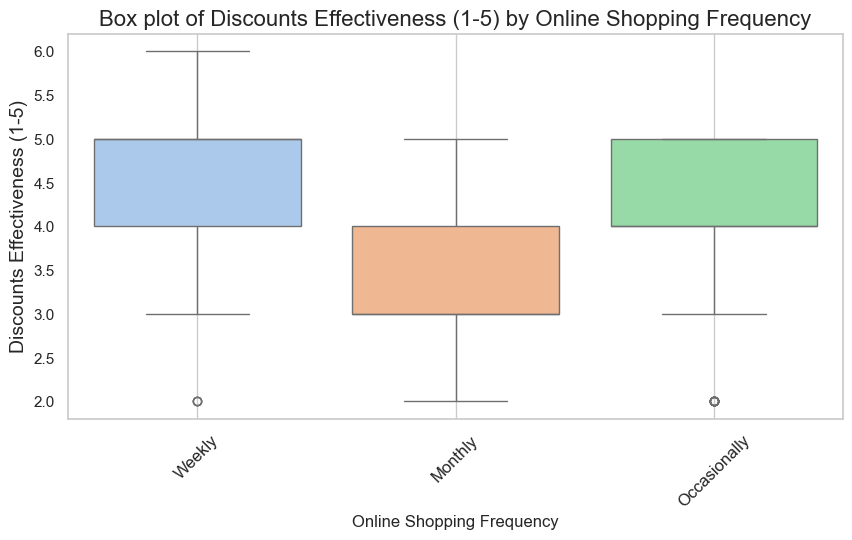

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




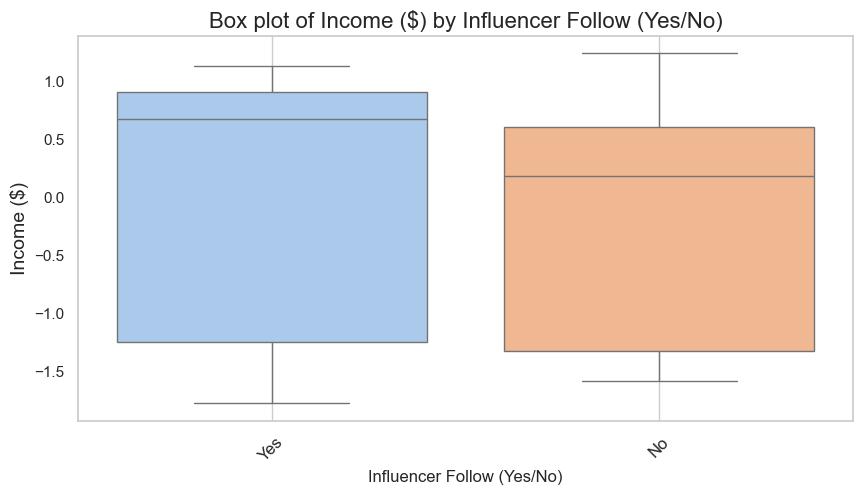

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




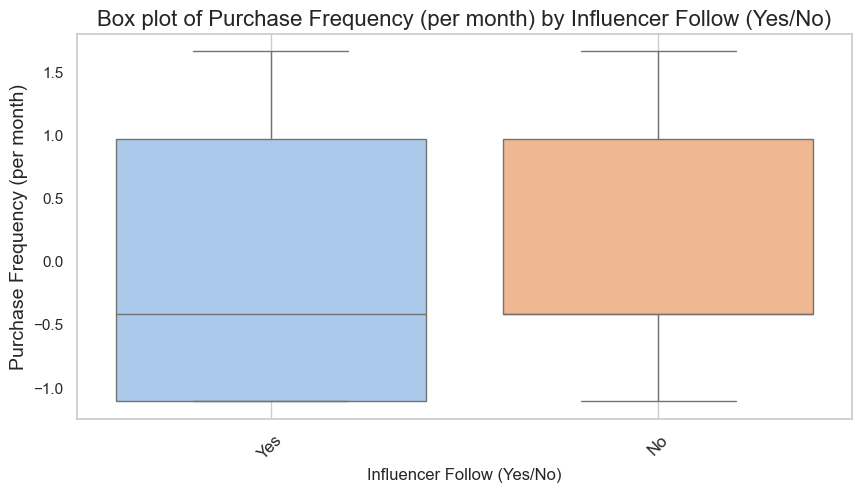

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




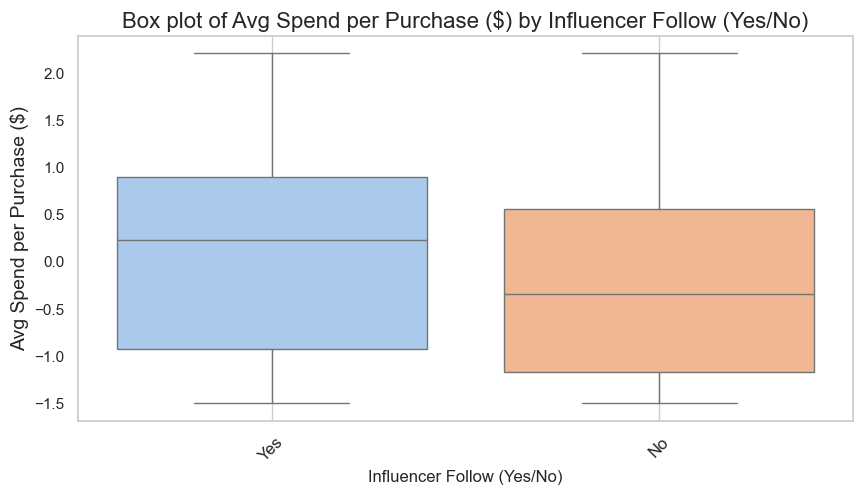

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




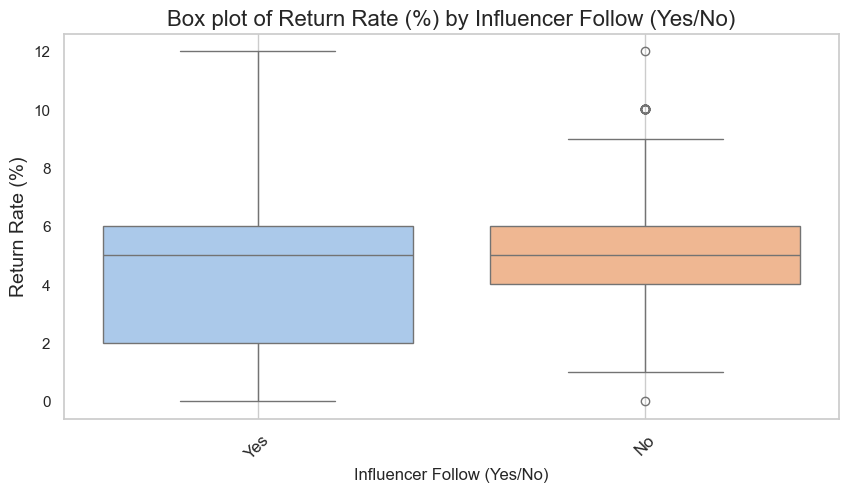

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




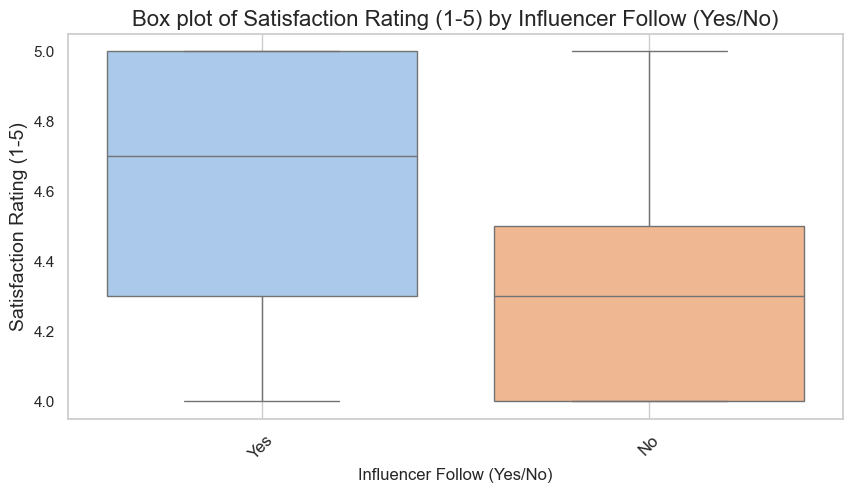

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




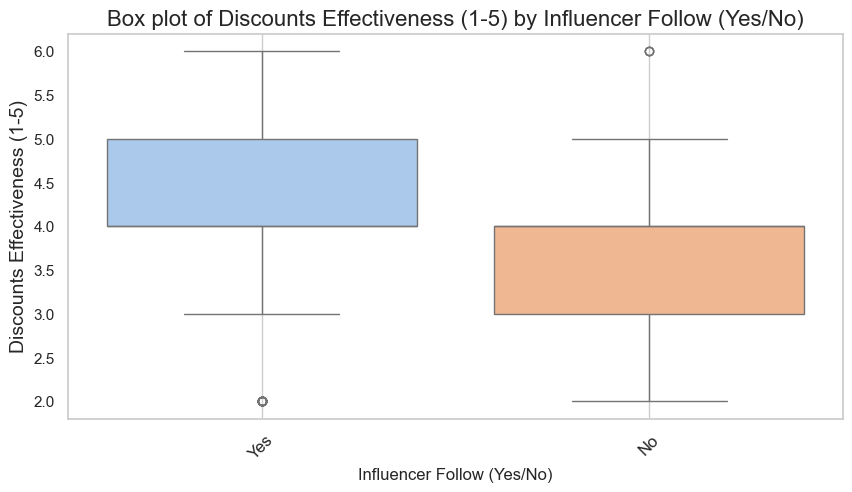

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




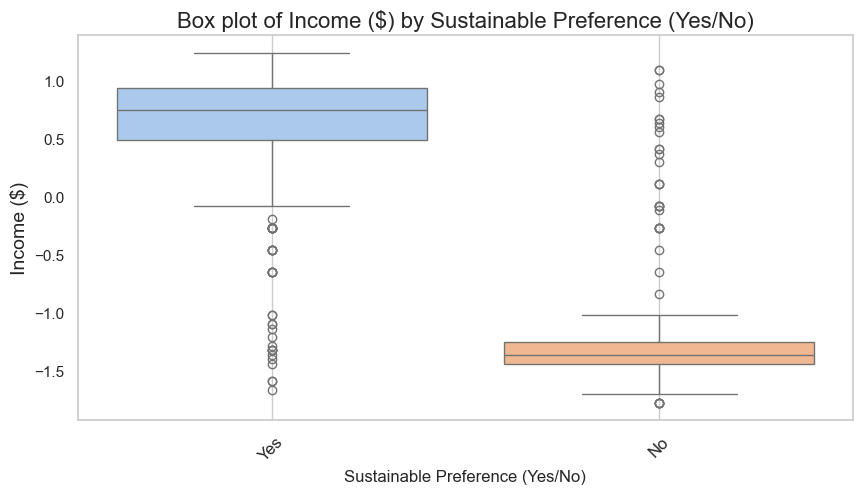

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




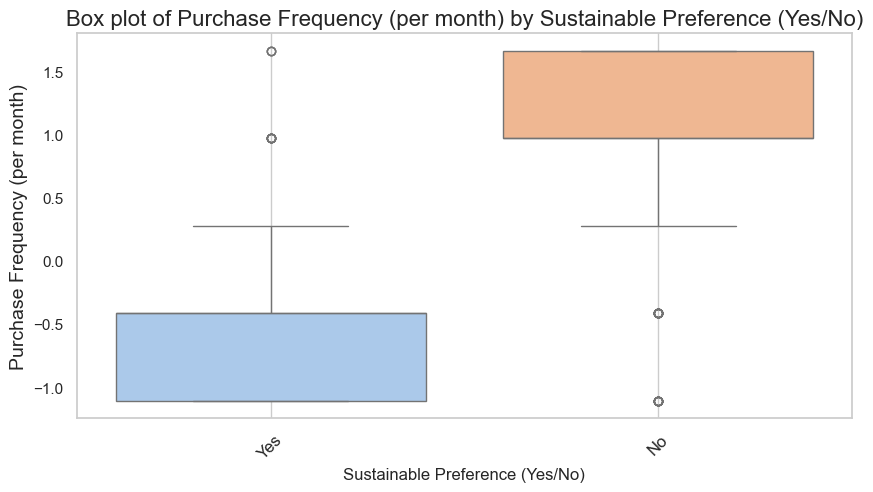

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




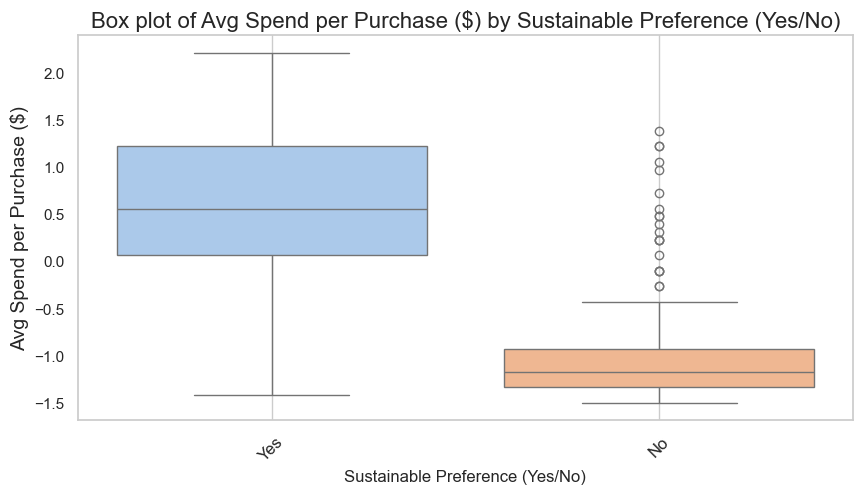

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




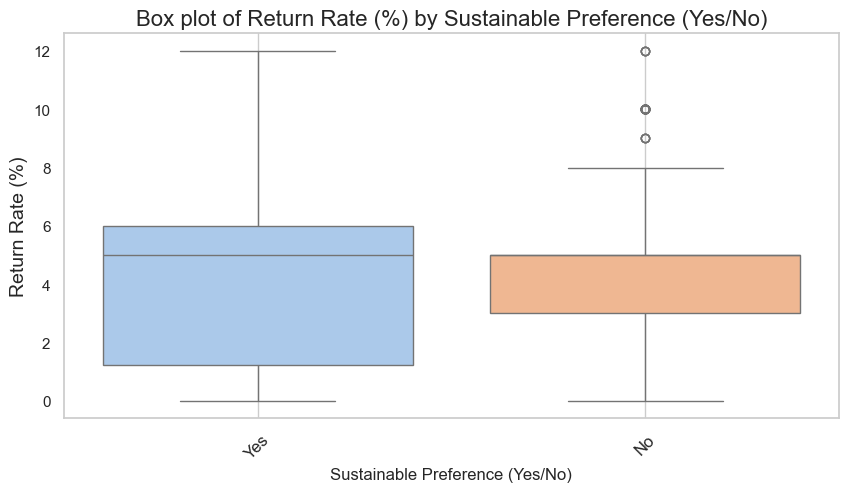

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




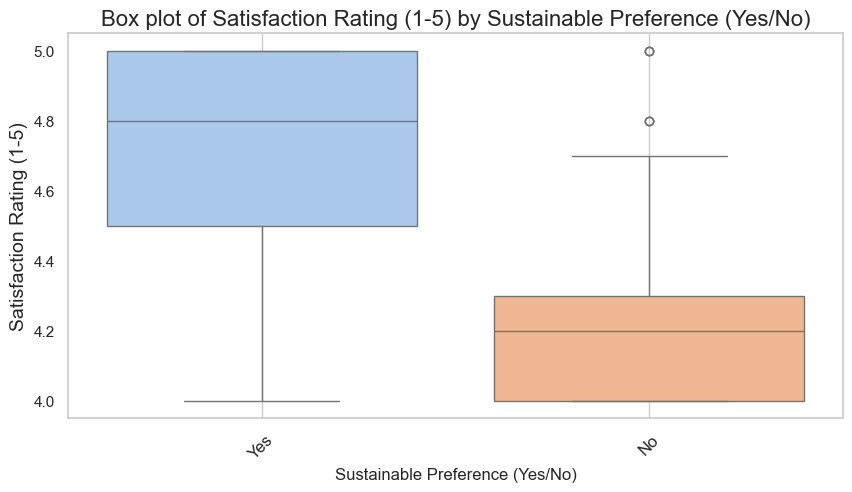

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




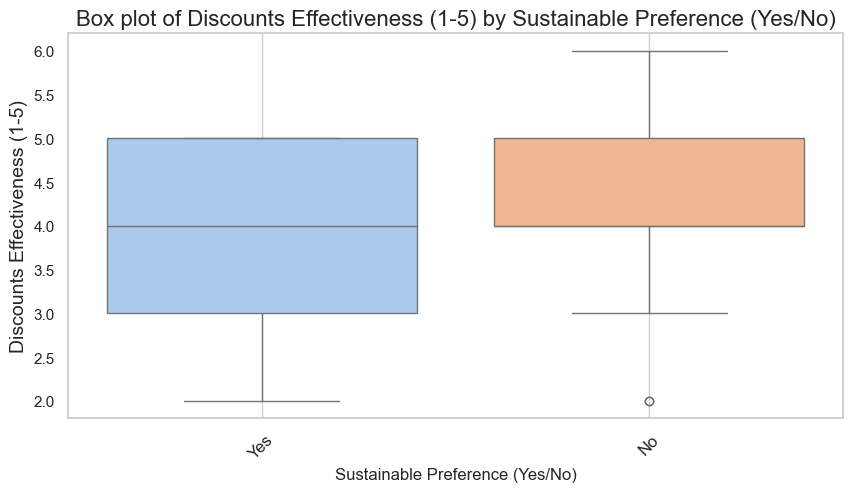

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




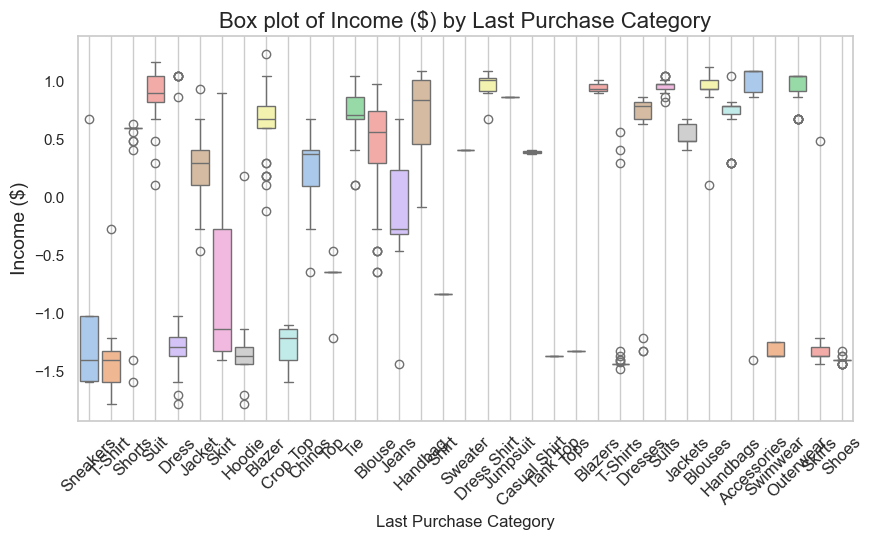

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




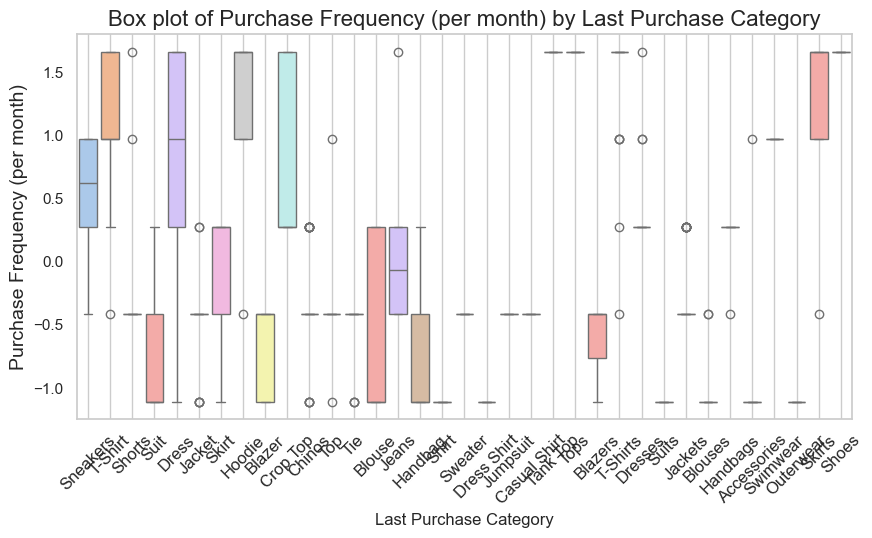

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




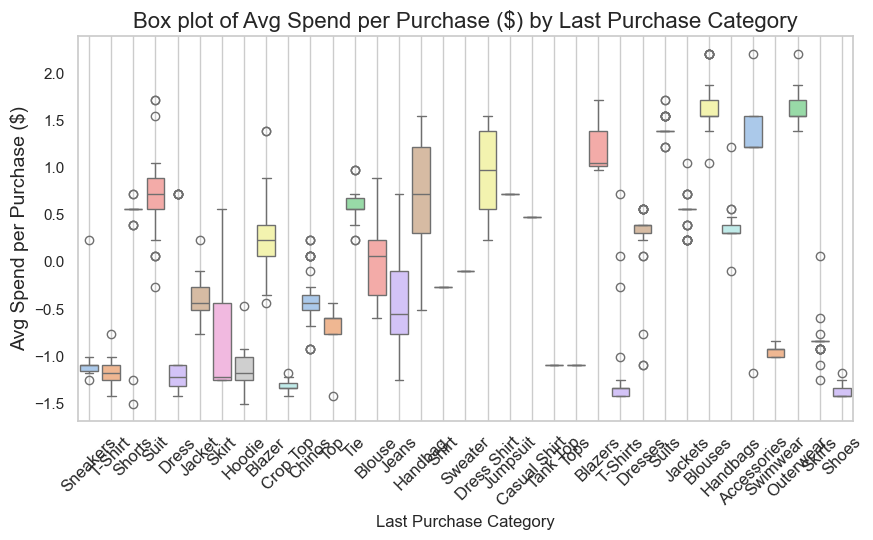

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




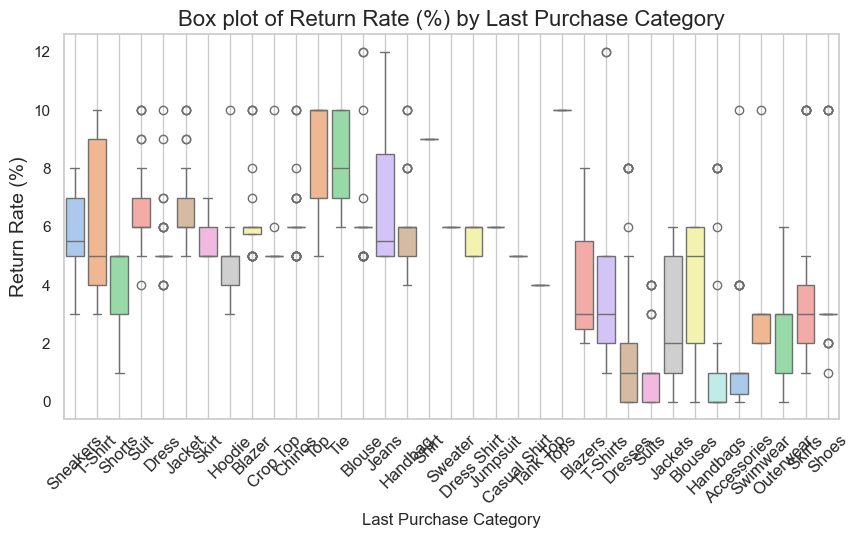

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




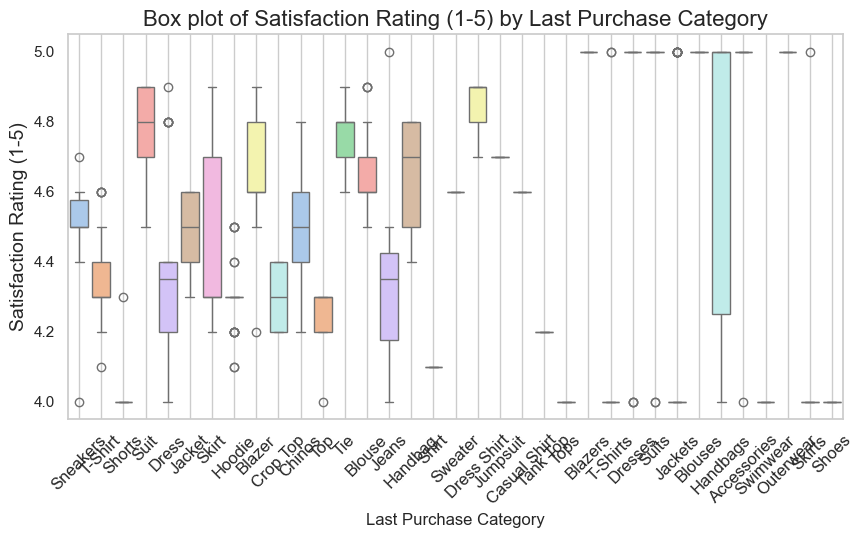

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




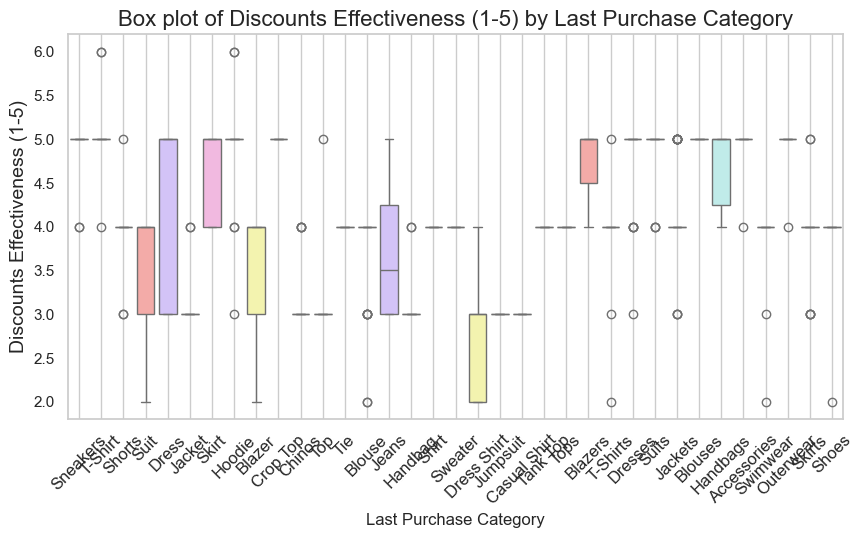

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




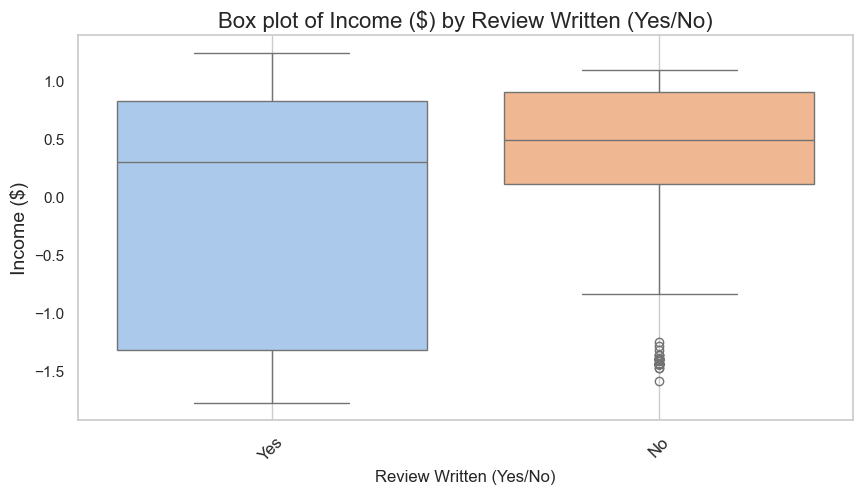

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




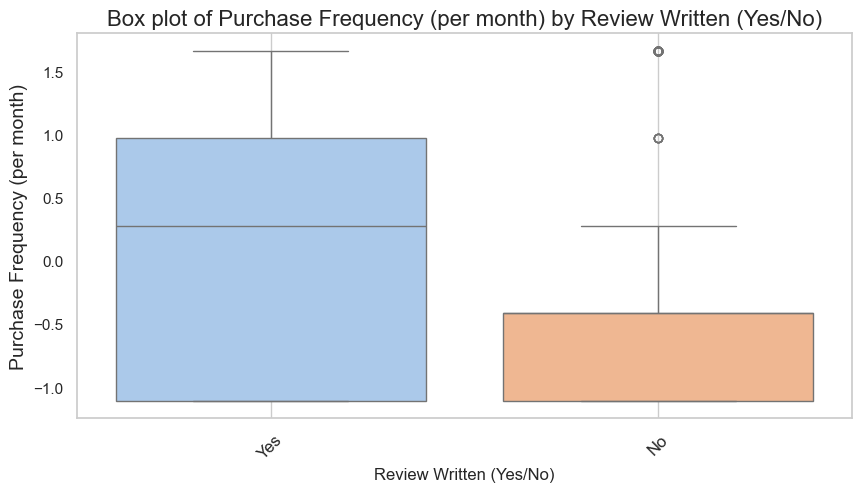

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




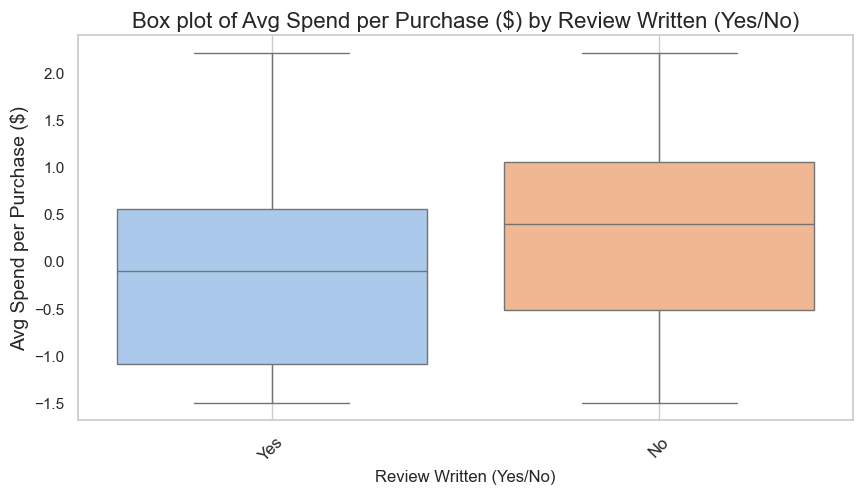

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




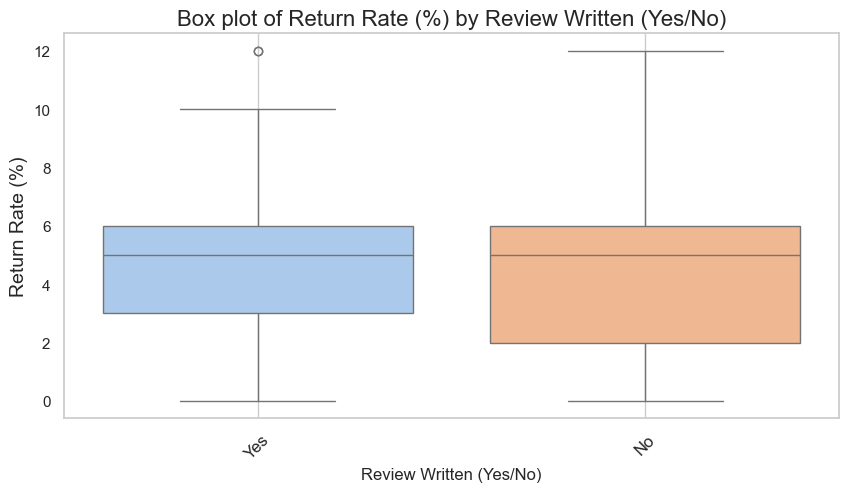

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




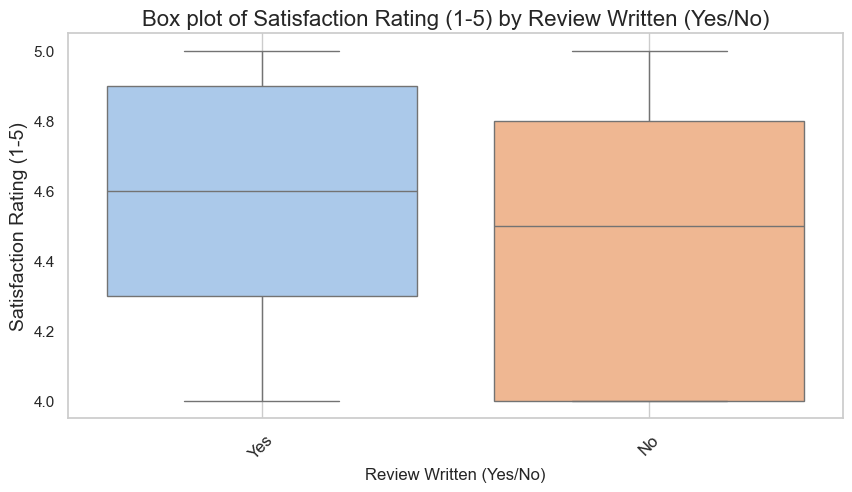

C:\Users\hp\AppData\Local\Temp\ipykernel_19500\3464606067.py:64: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




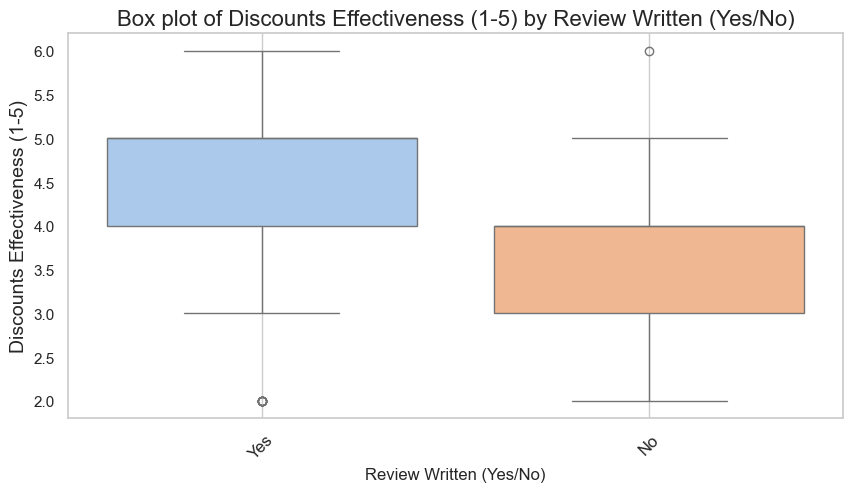

### Multivariate Analysis ###


C:\Users\hp\Documents\Python Scripts\lib\site-packages\seaborn\axisgrid.py:1513: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

C:\Users\hp\Documents\Python Scripts\lib\site-packages\seaborn\axisgrid.py:1513: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

C:\Users\hp\Documents\Python Scripts\lib\site-packages\seaborn\axisgrid.py:1513: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

C:\Users\hp\Documents\Python Scripts\lib\site-packages\seaborn\axisgrid.py:1513: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

C:\Users\hp\Documents\Python Scripts\lib\site-packages\seaborn\axisgrid.py:1513: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

C:\Users\hp\Documents\Python Scripts\lib\site-packages\seaborn\axisgrid.py:1513: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

C:\Users\hp\Documents\Python Scripts\lib

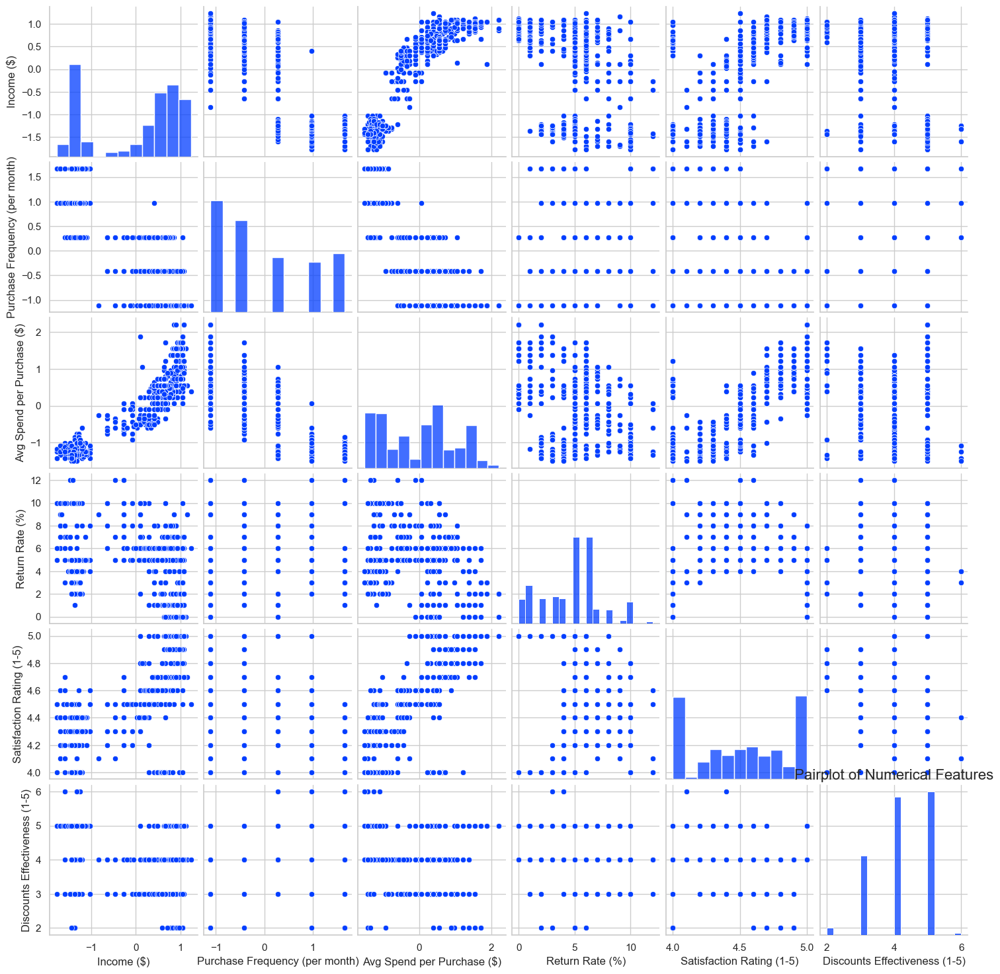

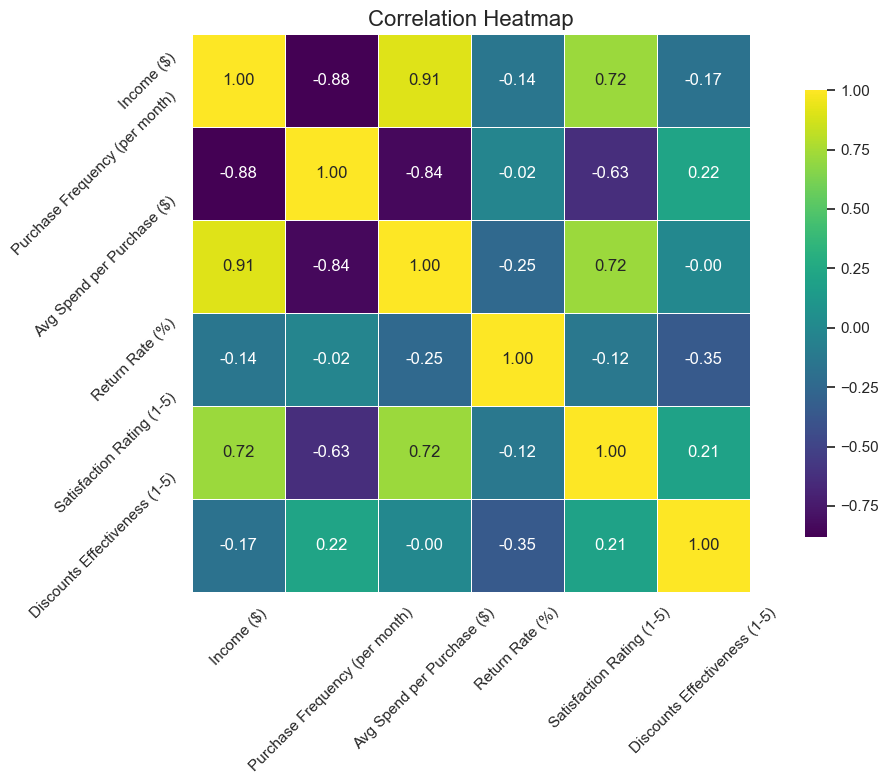

In [17]:
# Exploratory Data Analysis
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# Exclude specified columns
df1 = df.drop(columns=['Occupation', 'ID', 'Consumer ID', 'Favorite Brand'])

# Define numerical and categorical columns
numerical_cols = df1.select_dtypes(include=['float64', 'int64']).columns
categorical_cols = df1.select_dtypes(include=['object']).columns

# Set the style for seaborn
sns.set(style='whitegrid', palette='bright')

# Univariate Analysis
def univariate_analysis(df1):
    print("### Univariate Analysis ###")
    
    # Summary statistics
    print("Summary Statistics:")
    print(df1.describe())
    
    # Distribution plots for numerical columns
    for col in numerical_cols:
        plt.figure(figsize=(10, 5))
        sns.histplot(df[col], bins=30, kde=True, color='skyblue')
        plt.title(f'Distribution of {col}', fontsize=16)
        plt.xlabel(col, fontsize=14)
        plt.ylabel('Frequency', fontsize=14)
        plt.grid()
        plt.show()
        
    # Count plots for categorical columns
    for col in categorical_cols:
        plt.figure(figsize=(10, 5))
        sns.countplot(data=df1, x=col, palette='viridis')
        plt.title(f'Count of {col}', fontsize=16)
        plt.xticks(rotation=45, fontsize=12)
        plt.ylabel('Count', fontsize=14)
        plt.grid()
        plt.show()

# Bivariate Analysis
def bivariate_analysis(df1):
    print("### Bivariate Analysis ###")
    
    # Scatter plots for numerical variables
    for i in range(len(numerical_cols)):
        for j in range(i + 1, len(numerical_cols)):
            plt.figure(figsize=(10, 5))
            sns.scatterplot(data=df1, x=numerical_cols[i], y=numerical_cols[j], color='orange', edgecolor='black')
            plt.title(f'Scatter plot of {numerical_cols[i]} vs {numerical_cols[j]}', fontsize=16)
            plt.xlabel(numerical_cols[i], fontsize=14)
            plt.ylabel(numerical_cols[j], fontsize=14)
            plt.grid()
            plt.show()
    
    # Box plots for numerical vs categorical
    for cat_col in categorical_cols:
        for num_col in numerical_cols:
            plt.figure(figsize=(10, 5))
            sns.boxplot(data=df1, x=cat_col, y=num_col, palette='pastel')
            plt.title(f'Box plot of {num_col} by {cat_col}', fontsize=16)
            plt.xticks(rotation=45, fontsize=12)
            plt.ylabel(num_col, fontsize=14)
            plt.grid()
            plt.show()

# Multivariate Analysis
def multivariate_analysis(df1):
    print("### Multivariate Analysis ###")
    
    # Pairplot for numerical variables
    sns.pairplot(df1[numerical_cols], palette='husl')
    plt.title('Pairplot of Numerical Features', fontsize=16)
    plt.show()
    
    # Correlation heatmap
    plt.figure(figsize=(12, 8))
    correlation = df1[numerical_cols].corr()
    
   
    # Use a more vibrant colormap
    sns.heatmap(correlation, annot=True, cmap='viridis', fmt='.2f', square=True, linewidths=0.5, cbar_kws={"shrink": .8})

    plt.title('Correlation Heatmap', fontsize=16)
    plt.xticks(rotation=45)
    plt.yticks(rotation=45)
    plt.tight_layout()  
    plt.show()

# Run EDA functions
univariate_analysis(df1)
bivariate_analysis(df1)
multivariate_analysis(df1)


### Feature Engineering
Feature engineering is the process of using domain knowledge to create, transform, or select variables (features) that will be used in machine learning models. The goal is to improve the model's performance by providing it with the most relevant and informative data.

#### Key Aspects of Feature Engineering

1. **Creating New Features**:
   - Combining existing features (e.g., adding or multiplying columns).
   - Deriving new features from raw data (e.g., extracting the month from a date).

2. **Transforming Features**:
   - Normalizing or scaling numerical features to ensure they are on a similar scale (e.g., Min-Max scaling, Z-score normalization).
   - Encoding categorical features into numerical formats (e.g., one-hot encoding, label encoding).

3. **Selecting Features**:
   - Identifying and retaining only the most relevant features to reduce dimensionality (e.g., using techniques like Recursive Feature Elimination or feature importance from models).
   - Removing irrelevant or redundant features that could lead to overfitting.

4. **Handling Missing Values**:
   - Imputing missing values (e.g., using the mean, median, or mode).
   - Creating binary indicators for missing values.

5. **Aggregating Features**:
   - Summarizing data over groups (e.g., total sales per customer).
   - Creating features that capture trends over time (e.g., moving averages).

#### Importance of Feature Engineering
- **Model Performance**: Well-engineered features can significantly enhance the predictive power of a model.
- **Interpretability**: Simplified and meaningful features can make models easier to understand.
- **Reducing Overfitting**: By focusing on the most relevant features, models are less likely to learn noise from the data.

Effective feature engineering often requires experimentation and iteration, and it's considered both an art and a science in the field of machine learning.

Confusion Matrix:
[[156   0]
 [  2 135]]

Accuracy Score: 0.9931740614334471

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99       156
           1       1.00      0.99      0.99       137

    accuracy                           0.99       293
   macro avg       0.99      0.99      0.99       293
weighted avg       0.99      0.99      0.99       293



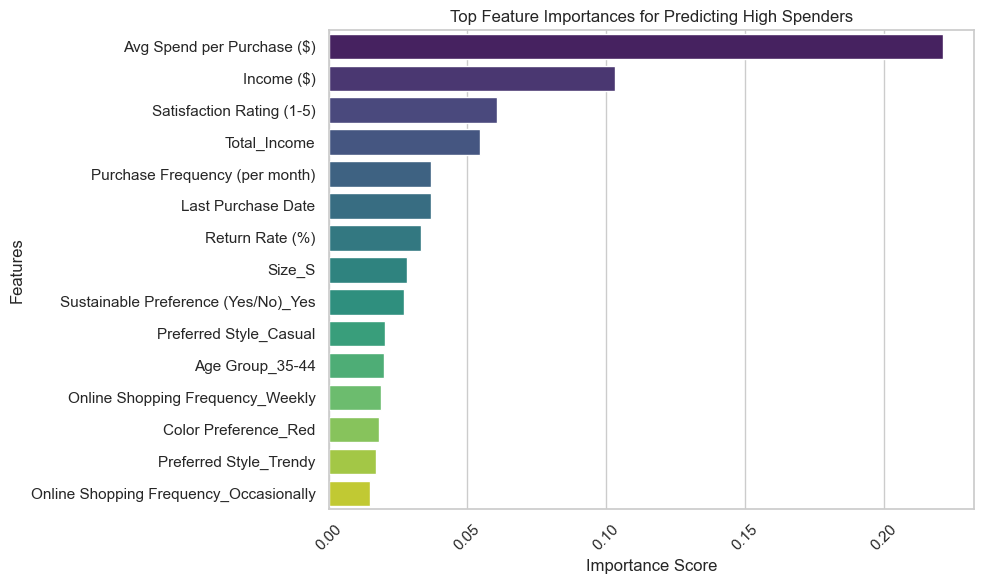

In [18]:
# Feature Engineering
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import mean_squared_error, confusion_matrix, accuracy_score, classification_report
import warnings

warnings.filterwarnings('ignore')


# Dropping unnecessary columns
df2 = df.drop(columns=['Occupation', 'ID', 'Customer ID', 'Favorite Brand'], errors='ignore')

# Convert date columns to numerical if any
for col in df2.select_dtypes(include=['datetime64[ns]', 'datetime64[ns, UTC]']):
    df2[col] = df2[col].astype('int64') // 10**9  # Convert to seconds since epoch

# Create a binary feature for high spenders
df2['High_Spender'] = np.where(df2['Avg Spend per Purchase ($)'] > df2['Avg Spend per Purchase ($)'].median(), 1, 0)

# Create a total income feature
df2['Total_Income'] = df2['Income ($)'] * df2['Purchase Frequency (per month)']

# Encoding categorical features (if any)
df2= pd.get_dummies(df2, drop_first=True)

# Splitting data into features and target
X = df2.drop(columns=['High_Spender'], errors='ignore')
y = df2['High_Spender']

# Scaling numerical features
scaler = StandardScaler()
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns
X[numerical_cols] = scaler.fit_transform(X[numerical_cols])

# Splitting the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Building a Random Forest Classifier model
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Making predictions
y_pred = model.predict(X_test)

# Evaluating the model
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nAccuracy Score:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# After calculating feature importances
importances = model.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': importances})

# Sort the DataFrame by importance
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Limit to top N features for clarity
top_n = 15  
top_features = feature_importance_df.head(top_n)

# Improved Visualization
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=top_features, palette='viridis')
plt.title('Top Feature Importances for Predicting High Spenders')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.xticks(rotation=45)
plt.tight_layout() 
plt.show()

### Statistical analysis

Statistical analysis involves collecting, examining, and interpreting data to uncover patterns, trends, or insights. It's a fundamental aspect of data analysis used across various fields, including economics, psychology, biology, and more. Here are some common methods and techniques that fall under statistical analysis:
1. Descriptive Statistics
- **Mean**: The average of a dataset.
- **Median**: The middle value when data is sorted.
- **Mode**: The most frequently occurring value.
- **Standard Deviation**: Measures the amount of variation or dispersion in a set of values.
- **Variance**: The square of the standard deviation, representing variability in the dataset.
- **Range**: The difference between the maximum and minimum values.
2. Inferential Statistics
- **Hypothesis Testing**: Testing an assumption about a parameter in a population using sample data.
- **t-tests**: Compare means between two groups.
- **ANOVA (Analysis of Variance)**: Compares means among three or more groups.
- **Chi-Square Tests**: Assesses the association between categorical variables.
- **Correlation Analysis**: Measures the strength and direction of the relationship between two continuous variables (e.g., Pearson's correlation).
- **Regression Analysis**: Examines the relationship between dependent and independent variables to predict outcomes (e.g., linear regression, logistic regression).
3. Multivariate Analysis
- **Factor Analysis**: Reduces data dimensions by identifying underlying relationships among variables.
- **Principal Component Analysis (PCA)**: Transforms data into a set of orthogonal components, reducing dimensionality while preserving variance.
- **Cluster Analysis**: Groups a set of objects in such a way that objects in the same group are more similar than those in other groups.
4. Non-parametric Tests
- Tests that do not assume a specific distribution for the data (e.g., Mann-Whitney U test, Wilcoxon signed-rank test).
5. Time Series Analysis
- Analyzing data points collected or recorded at specific time intervals to identify trends, cycles, or seasonal variations (e.g., ARIMA models).
6. Survival Analysis
- Used to analyze the expected duration until one or more events happen, such as failure or death (e.g., Kaplan-Meier estimator).
7. Bayesian Analysis
- Involves using Bayes' theorem to update the probability for a hypothesis as more evidence or information becomes available.

In [19]:
pip install lifelines

Note: you may need to restart the kernel to use updated packages.


In [20]:
pip install pandas numpy scipy statsmodels


Note: you may need to restart the kernel to use updated packages.


In [21]:
# Statistical analysis part 1
import pandas as pd
import numpy as np
from scipy import stats
import statsmodels.api as sm


# 1. Chi-Square Test for Independence
# Example: Testing if 'Gender' and 'Favorite Brand' are independent
contingency_table = pd.crosstab(df['Gender'], df['Favorite Brand'])
chi2, p, dof, expected = stats.chi2_contingency(contingency_table)
print(f"Chi-square test: chi2 = {chi2}, p-value = {p}")

# 2. ANOVA Test
# Example: Checking if there's a significant difference in 'Avg Spend per Purchase' based on 'Occupation'
anova_data = [group['Avg Spend per Purchase ($)'].values for name, group in df.groupby('Occupation')]
anova_result = stats.f_oneway(*anova_data)
print(f"ANOVA test: F-statistic = {anova_result.statistic}, p-value = {anova_result.pvalue}")

# 3. T-Test
# Example: Compare 'Avg Spend per Purchase' between 'Male' and 'Female'
male_spend = df[df['Gender'] == 'Male']['Avg Spend per Purchase ($)']
female_spend = df[df['Gender'] == 'Female']['Avg Spend per Purchase ($)']
t_stat, p_val = stats.ttest_ind(male_spend, female_spend)
print(f"T-test: t-statistic = {t_stat}, p-value = {p_val}")

# 4. Mann-Whitney U Test
# Example: Comparing 'Satisfaction Rating' between 'Influencer Follow' groups
influencer_yes = df[df['Influencer Follow (Yes/No)'] == 'Yes']['Satisfaction Rating (1-5)']
influencer_no = df[df['Influencer Follow (Yes/No)'] == 'No']['Satisfaction Rating (1-5)']
u_stat, p_val_mw = stats.mannwhitneyu(influencer_yes, influencer_no)
print(f"Mann-Whitney U Test: U-statistic = {u_stat}, p-value = {p_val_mw}")

# 5. Pearson and Spearman Correlation
# Example: Correlation between 'Income ($)' and 'Avg Spend per Purchase ($)'
pearson_corr, pearson_p = stats.pearsonr(df['Income ($)'], df['Avg Spend per Purchase ($)'])
spearman_corr, spearman_p = stats.spearmanr(df['Income ($)'], df['Avg Spend per Purchase ($)'])
print(f"Pearson correlation: coefficient = {pearson_corr}, p-value = {pearson_p}")
print(f"Spearman correlation: coefficient = {spearman_corr}, p-value = {spearman_p}")

# 6. Confidence Interval for 'Avg Spend per Purchase ($)'
confidence_level = 0.95
degrees_freedom = len(df['Avg Spend per Purchase ($)']) - 1
sample_mean = np.mean(df['Avg Spend per Purchase ($)'])
sample_standard_error = stats.sem(df['Avg Spend per Purchase ($)'])
confidence_interval = stats.t.ppf((1 + confidence_level) / 2, degrees_freedom) * sample_standard_error
lower_bound = sample_mean - confidence_interval
upper_bound = sample_mean + confidence_interval
print(f"Confidence interval for Avg Spend per Purchase: ({lower_bound}, {upper_bound})")


Chi-square test: chi2 = 619.366872777155, p-value = 2.675258416299257e-113
ANOVA test: F-statistic = 182.6882018667821, p-value = 0.0
T-test: t-statistic = -1.7266641340714068, p-value = 0.08454507563320537
Mann-Whitney U Test: U-statistic = 144384.0, p-value = 6.956107136638077e-31
Pearson correlation: coefficient = 0.9061931627600043, p-value = 0.0
Spearman correlation: coefficient = 0.90765793013001, p-value = 0.0
Confidence interval for Avg Spend per Purchase: (-0.06284709956986993, 0.06284709956986999)


#### Explanation

**Chi-Square Test**: Tests the independence between two categorical variables (e.g., Gender and Favorite Brand).

**ANOVA Test**: Tests if there are significant differences in means across multiple groups (e.g., Avg Spend based on Occupation).

**T-Test**: Compares means between two groups (e.g., Avg Spend between Male and Female).

**Mann-Whitney U Test**: Non-parametric test for comparing differences between two independent groups.

**Correlation Tests**: Pearson for linear correlation and Spearman for rank correlation.

**Confidence Interval**: Calculates the confidence interval for the mean of Avg Spend per Purchase.

#### Summary of Statistical Analysis Results

1. **Chi-Square Test**:
   - **Chi-square statistic**: 619.37
   - **p-value**: \(2.68 \times 10^{-113}\)
   - **Interpretation**: There is a statistically significant association between gender and favorite brand, indicating that gender influences brand preference in the dataset.

2. **ANOVA Test**:
   - **F-statistic**: 182.69
   - **p-value**: 0.00
   - **Interpretation**: There are significant differences in average spending per purchase across different occupations. This suggests that occupation plays a substantial role in influencing spending behavior.

3. **T-Test**:
   - **t-statistic**: -1.73
   - **p-value**: 0.085
   - **Interpretation**: The p-value indicates that there is no statistically significant difference in average spending per purchase between males and females at the 0.05 significance level. However, the p-value is close to this threshold, suggesting a trend that might be worth further investigation.

4. **Mann-Whitney U Test**:
   - **U-statistic**: 144,384.0
   - **p-value**: \(6.96 \times 10^{-31}\)
   - **Interpretation**: There is a significant difference in satisfaction ratings between those who follow influencers and those who do not, indicating that influencer following impacts customer satisfaction.

5. **Correlation Analysis**:
   - **Pearson correlation coefficient**: 0.91
   - **p-value**: 0.00
   - **Interpretation**: There is a strong positive linear relationship between income and average spending per purchase, suggesting that higher income is associated with higher spending.
   - **Spearman correlation coefficient**: 0.91
   - **p-value**: 0.00
   - **Interpretation**: The rank correlation also shows a strong positive association, confirming the results from the Pearson correlation.

6. **Confidence Interval for Average Spend per Purchase**:
   - **Confidence Interval**: (-0.06, 0.06)
   - **Interpretation**: The interval includes zero, suggesting uncertainty in the mean average spend. This reinforces the T-test finding that there may not be a significant difference in spending behavior.

#### Insights
The analysis indicates significant relationships and differences in the dataset. Gender and occupation significantly affect brand preference and spending behavior, while influencer follow status is related to satisfaction ratings. Additionally, income strongly correlates with spending. However, the T-test suggests that the difference in average spending between genders is not statistically significant. The confidence interval further emphasizes this uncertainty in the mean spending behavior.

Descriptive Statistics:
                ID    Income ($)  Purchase Frequency (per month)  \
count   976.000000  9.760000e+02                    9.760000e+02   
mean    503.081967 -2.329648e-16                    1.274026e-16   
std     288.281724  1.000513e+00                    1.000513e+00   
min       1.000000 -1.778798e+00                   -1.109663e+00   
25%     253.750000 -1.289059e+00                   -1.109663e+00   
50%     497.500000  4.815371e-01                   -4.163011e-01   
75%     756.250000  8.582596e-01                    9.704221e-01   
max    1000.000000  1.234982e+00                    1.663784e+00   

       Avg Spend per Purchase ($)  Return Rate (%)  Satisfaction Rating (1-5)  \
count                9.760000e+02       976.000000                 976.000000   
mean                 2.912060e-17         4.628074                   4.521311   
std                  1.000513e+00         2.602561                   0.371134   
min                 -1.505264e+00      

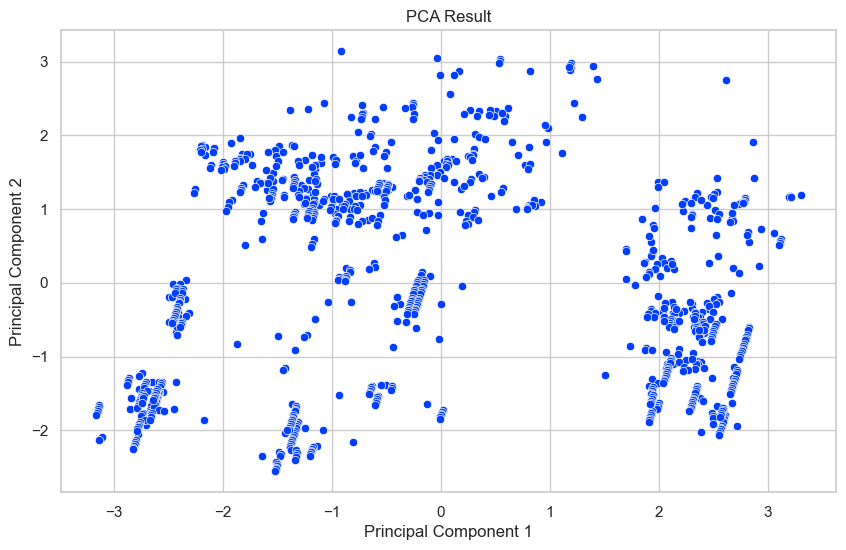

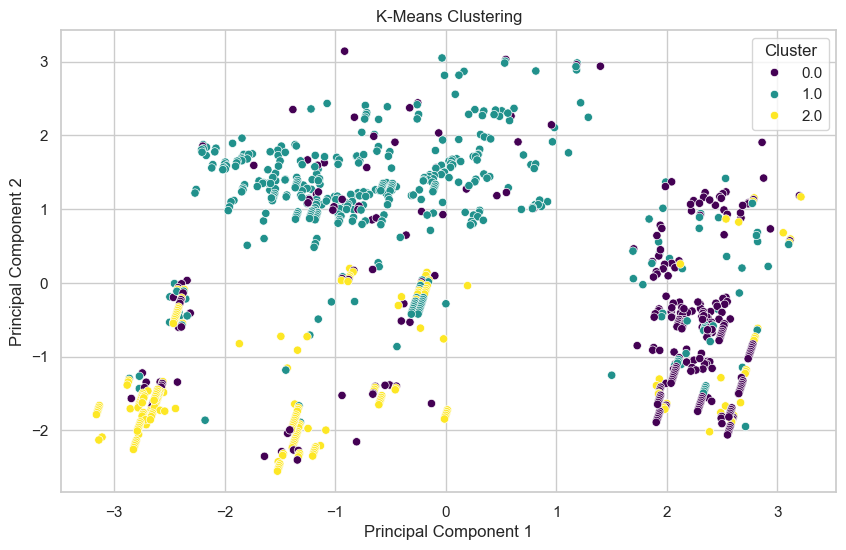


Statistical analysis completed.


In [22]:
# Statistical analysis part 2
import pandas as pd
import numpy as np
import statsmodels.api as sm
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
from lifelines import KaplanMeierFitter


# Drop the non-numeric columns (like Consumer ID)
df_numeric = df.select_dtypes(include=[np.number])

# Descriptive Statistics
print("Descriptive Statistics:")
print(df_numeric.describe())

# Mean, Median, Mode, Std Dev, Variance, Range
mean = df_numeric.mean()
median = df_numeric.median()
mode = df_numeric.mode().iloc[0]  # mode() returns a DataFrame
std_dev = df_numeric.std()
variance = df_numeric.var()
data_range = df_numeric.max() - df_numeric.min()

print("\nMean:\n", mean)
print("\nMedian:\n", median)
print("\nMode:\n", mode)
print("\nStandard Deviation:\n", std_dev)
print("\nVariance:\n", variance)
print("\nRange:\n", data_range)

# Correlation Analysis
correlation_matrix = df_numeric.corr()
print("\nCorrelation Matrix:\n", correlation_matrix)

# Regression Analysis
# Assuming 'target' is the dependent variable and the rest are independent variables
if 'target' in df.columns:
    X = df_numeric.drop('target', axis=1, errors='ignore')  # Avoid KeyError if 'target' is not present
    y = df['target']
    X = sm.add_constant(X)  # Add constant term for intercept
    model = sm.OLS(y, X).fit()
    print("\nRegression Results:\n", model.summary())

# Multivariate Analysis
# PCA
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_numeric)  # Scale numeric columns
pca = PCA(n_components=2)  # Change n_components as needed
principal_components = pca.fit_transform(df_scaled)

# Create a DataFrame for PCA results
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

# K-Means Clustering
kmeans = KMeans(n_clusters=3)  # Change n_clusters as needed
df['Cluster'] = kmeans.fit_predict(df_scaled)

# Add the Cluster assignments to the PCA DataFrame
pca_df['Cluster'] = df['Cluster']

# Visualization of PCA
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', data=pca_df)
plt.title('PCA Result')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

# Visualization of K-Means Clustering
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=pca_df, palette='viridis')
plt.title('K-Means Clustering')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.show()

# Time Series Analysis (Example)
# Assuming you have a datetime column 'date' and a value column 'value'
if 'date' in df.columns and 'value' in df.columns:
    df['date'] = pd.to_datetime(df['date'])  # Ensure 'date' is datetime
    df.set_index('date', inplace=True)
    df['value'].plot(title='Time Series Analysis')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.show()

# Survival Analysis (Example)
# Assuming 'duration' is the time until event and 'event' is whether the event occurred (1) or not (0)
if 'duration' in df.columns and 'event' in df.columns:
    kmf = KaplanMeierFitter()
    kmf.fit(durations=df['duration'], event_observed=df['event'])
    kmf.plot(title='Survival Analysis')
    plt.xlabel('Duration')
    plt.ylabel('Survival Probability')
    plt.show()

print("\nStatistical analysis completed.")


#### Summary of Descriptive Statistics

- **Income** is normalized, with a mean close to 0, reflecting significant variability (std dev of 1.00) in income levels among customers.
- **Purchase Frequency** also shows a mean around 0, with values ranging from -1.11 to 1.66.
- **Average Spend per Purchase** and **Return Rate** show similar patterns, with averages near zero for spending and a mean return rate of 4.63, indicating good customer retention.
- **Satisfaction Ratings** average 4.52 (out of 5), demonstrating high customer satisfaction.
- **Discount Effectiveness** scores average 4.14, suggesting that discounts are perceived positively by customers.
- The **Cluster** variable, with a mean of 0.92, indicates distinct customer segments.

**Correlations** highlight strong positive relationships between income and average spend, while there are notable negative correlations between purchase frequency and income. Overall, the analysis reveals diverse customer behaviors, high satisfaction levels, and potential for targeted marketing strategies based on clustering results.

### Clustering and Segmentation 

**Clustering and Segmentation Analysis** are techniques used to group similar items or data points together based on specific characteristics. Here’s a breakdown of each:

#### Clustering

1. **Definition**: Clustering is a machine learning technique that involves grouping a set of objects in such a way that objects in the same group (or cluster) are more similar to each other than to those in other groups. 

2. **Purpose**: The main goal is to identify patterns and structures within data without predefined labels. Clustering is often used in exploratory data analysis to understand the underlying distribution of the data.

3. **Types of Clustering**:
   - **Hierarchical Clustering**: Builds a tree of clusters by either merging or splitting them recursively.
   - **K-Means Clustering**: Divides data into K clusters by minimizing the variance within each cluster.
   - **DBSCAN (Density-Based Spatial Clustering of Applications with Noise)**: Groups points based on their density in a region, useful for identifying clusters of varying shapes and sizes.

4. **Applications**: Clustering can be used in customer segmentation, image analysis, market research, social network analysis, and anomaly detection.

#### Segmentation Analysis

1. **Definition**: Segmentation analysis is a process of dividing a broader market or population into smaller segments based on specific characteristics or criteria.

2. **Purpose**: The aim is to identify and understand different groups within a population to tailor marketing strategies, products, or services to meet the needs of each segment more effectively.

3. **Types of Segmentation**:
   - **Demographic Segmentation**: Based on age, gender, income, education, etc.
   - **Psychographic Segmentation**: Based on lifestyle, personality traits, values, etc.
   - **Behavioral Segmentation**: Based on user behavior, such as purchase history, usage frequency, brand loyalty, etc.
   - **Geographic Segmentation**: Based on location, such as region, city, or climate.

4. **Applications**: Commonly used in marketing to target specific consumer groups, optimize product offerings, and improve customer satisfaction.

##### Key Differences

- **Focus**: Clustering is more about identifying natural groupings in data, while segmentation is a more strategic approach to targeting specific market groups.
- **Data Labeling**: Clustering typically does not require predefined labels, whereas segmentation often involves some predefined criteria for dividing the market.

Both clustering and segmentation analysis are valuable tools for understanding data and making informed decisions based on the inherent patterns and characteristics of the data.

### Elbow method
The elbow method is a technique used to determine the optimal number of clusters in K-Means clustering. It helps identify the point at which adding more clusters results in only a small increase in the explained variance (or a decrease in inertia). 

##### How It Works:

1. **K-Means Clustering**: K-Means is an algorithm that partitions data into a specified number of clusters (k) by minimizing the variance within each cluster.

2. **Inertia**: Inertia is the sum of squared distances between each data point and its assigned cluster centroid. Lower inertia values indicate better clustering, as data points are closer to their centroids.

3. **Plotting**:
   - The method involves plotting the inertia values against the number of clusters (k).
   - As you increase the number of clusters, inertia decreases, but the rate of decrease slows down after a certain point.

4. **Elbow Point**: 
   - The "elbow" point on the graph is where the curve starts to flatten. This point suggests the optimal number of clusters, as adding more clusters beyond this point yields diminishing returns in reducing inertia.

##### Steps to Use the Elbow Method:

1. Run K-Means clustering for a range of k values (e.g., 1 to 10).
2. Record the inertia for each k.
3. Plot the inertia values against the k values.
4. Identify the point where the plot shows a noticeable bend (the elbow).

By using the elbow method, you can make a more informed decision about the number of clusters to use in your analysis.

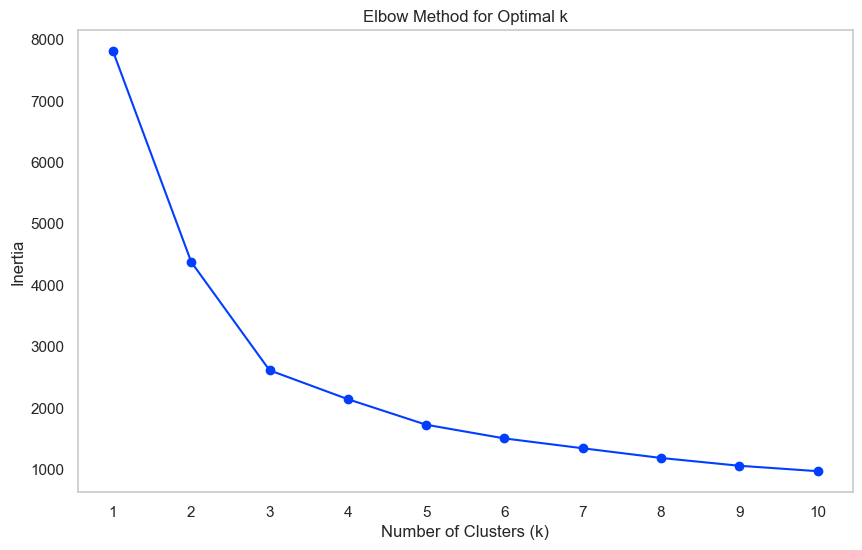

In [23]:
## Clustering and Segmentation
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt


# Drop the non-numeric columns (like Consumer ID)
df_numeric = df.select_dtypes(include=[np.number])

# Scale the numeric data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_numeric)

# Elbow Method Analysis
inertia = []  # List to store the inertia values

# Test different cluster sizes
for n_clusters in range(1, 11):  # Testing 1 to 10 clusters
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)

# Plotting the Elbow Curve
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.xticks(range(1, 11))
plt.grid()
plt.show()


### Market Basket Analysis

Market Basket Analysis (MBA) is a data mining technique used to identify relationships and patterns between items purchased together in transactions. It's commonly employed in retail and e-commerce to understand customer behavior and improve sales strategies. Here are some key points:

##### Key Concepts

1. **Association Rules**:
   - MBA identifies rules that indicate the likelihood of items being purchased together. For example, if a customer buys bread, they may also buy butter. This can be represented as an association rule: "If bread, then butter."

2. **Support**:
   - This measures how frequently a particular item or item set appears in transactions. For example, if 100 transactions include bread and 20 include butter, the support for the rule "bread → butter" is 20%.

3. **Confidence**:
   - This indicates the likelihood that a customer who buys an item will also buy another. For example, if 30 out of 100 customers who bought bread also bought butter, the confidence for the rule "bread → butter" is 30%.

4. **Lift**:
   - Lift measures how much more likely two items are purchased together compared to being purchased independently. A lift greater than 1 suggests a strong association.

##### Applications

- **Product Placement**: Retailers can place frequently co-purchased items near each other to increase sales.
- **Cross-Selling and Upselling**: Businesses can recommend related products during the purchase process.
- **Promotional Strategies**: Understanding customer buying patterns can inform targeted promotions and discounts.
- **Inventory Management**: Insights from MBA can help in stocking decisions and managing inventory levels.

##### Techniques

- **Apriori Algorithm**: A popular algorithm for mining frequent itemsets and generating association rules.
- **FP-Growth Algorithm**: An efficient algorithm that builds a compact data structure called the FP-tree for mining associations.

Market Basket Analysis is a powerful tool for uncovering hidden relationships in transaction data, ultimately helping businesses enhance customer experience and boost sales.

C:\Users\hp\Documents\Python Scripts\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:109: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



Frequent Itemsets:
      support                                     itemsets
0       0.24                                     (Blazer)
1       0.30                                     (Blouse)
2       0.26                                     (Chinos)
3       0.18                                   (Crop Top)
4       0.18                                      (Dress)
..       ...                                          ...
485     0.02      (Jeans, Handbag, Sneakers, Top, Jacket)
486     0.02           (Shorts, Tie, Jeans, Handbag, Top)
487     0.02  (Shorts, T-Shirt, Handbag, Sneakers, Skirt)
488     0.02        (Suit, Sneakers, Top, Jacket, Hoodie)
489     0.02    (Shorts, Suit, T-Shirt, Sneakers, Hoodie)

[490 rows x 2 columns]

Association Rules:
               antecedents                  consequents  antecedent support  \
0                (Blazer)                     (Blouse)                0.24   
1                (Blouse)                     (Blazer)                0.30   
2    

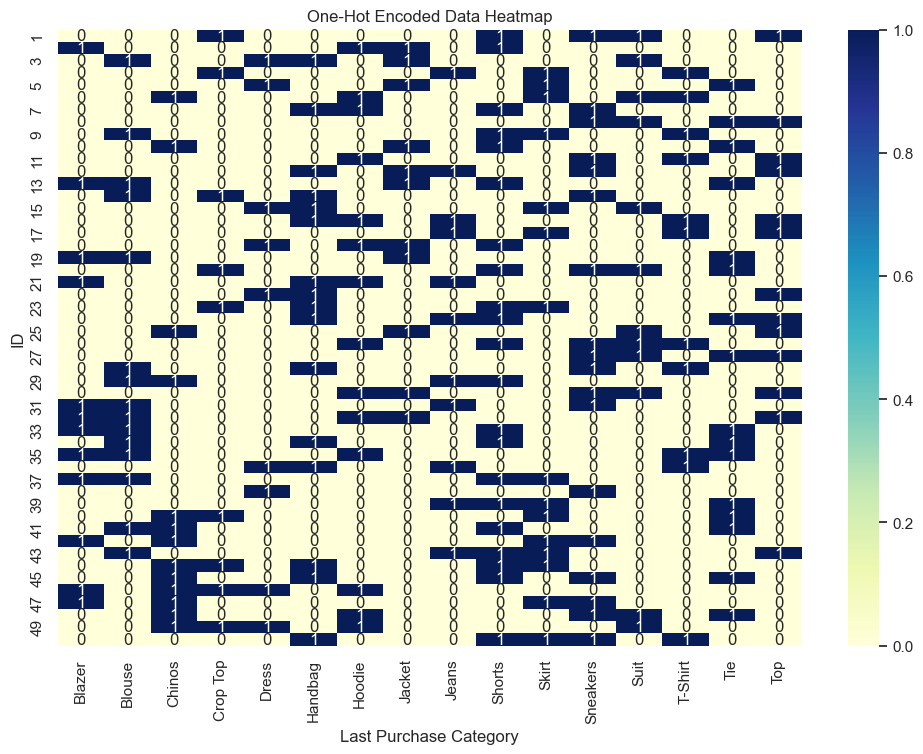

In [24]:
# Market basket analysis
import pandas as pd
import numpy as np
from mlxtend.frequent_patterns import apriori, association_rules
import matplotlib.pyplot as plt
import seaborn as sns

# Create a sample dataset
num_entries = 50
num_categories = 5  # Each ID can purchase multiple categories
categories = ['Sneakers', 'T-Shirt', 'Blouse', 'Shorts', 'Handbag', 'Suit', 
              'Dress', 'Jacket', 'Skirt', 'Hoodie', 'Jeans', 'Blazer',
              'Crop Top', 'Chinos', 'Tie', 'Top']

# Randomly select multiple categories for each ID
np.random.seed(0)  # For reproducibility
data = {
    'ID': np.repeat(np.arange(1, num_entries + 1), num_categories),
    'Last Purchase Category': np.random.choice(categories, size=num_entries * num_categories)
}

# Step 1: Convert the data into a DataFrame
df = pd.DataFrame(data)

# Step 2: Create a one-hot encoded DataFrame
basket = df.pivot_table(index='ID', columns='Last Purchase Category', aggfunc='size', fill_value=0)
# Convert counts to binary presence
basket[basket > 0] = 1

# Step 3: Generate frequent itemsets with lower support
min_support = 0.01  # Lowered minimum support threshold
frequent_itemsets = apriori(basket, min_support=min_support, use_colnames=True)
print("Frequent Itemsets:\n", frequent_itemsets)

# Step 4: Generate association rules with a lower confidence threshold
min_threshold = 0.2  # Lowered confidence threshold
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=min_threshold)
print("\nAssociation Rules:\n", rules)

# Step 5: Visualize the one-hot encoded data
plt.figure(figsize=(12, 8))
sns.heatmap(basket, cmap='YlGnBu', cbar=True, annot=True)
plt.title("One-Hot Encoded Data Heatmap")
plt.xlabel("Last Purchase Category")
plt.ylabel("ID")
plt.show()





#### Summary of Output

##### Frequent Itemsets
The analysis identified **490 frequent itemsets** with varying levels of support, indicating how often these itemsets appear in the dataset. The most significant itemsets include:

- **Single Items**:
  - **Blazer**: 24% support
  - **Blouse**: 30% support
  - **Chinos**: 26% support
- **Combinations of Items**: 
  - For example, an itemset like **(Jacket, Sneakers, Top, Jeans, Handbag)** has a support of 2%, showing it appears in 2% of transactions.

This indicates a broad variety of purchase combinations among the customers.

##### Association Rules
The analysis generated **2063 association rules** based on the frequent itemsets. Some key highlights include:

- **Top Rules**:
  - **(Blazer) → (Blouse)**: 58.3% confidence with a lift of 1.94, suggesting a strong association between buying a blazer and also purchasing a blouse.
  - **(Blouse) → (Blazer)**: 46.7% confidence with the same lift of 1.94, indicating a reciprocal relationship.
- **Other Notable Rules**:
  - **(Blazer) → (Chinos)**: 25% confidence, suggesting that those who buy a blazer are likely to buy chinos.
  - **(T-Shirt, Shorts) → (Sneakers, Suit, Hoodie)**: 33.3% confidence with a very high lift of 5.56, indicating a strong predictive power for these items being bought together.

##### Insights
- The high support for individual items like **Blouse** and **Chinos** suggests these are popular choices among customers.
- Strong association rules with high confidence and lift values indicate effective cross-selling opportunities. For instance, promoting blazers alongside blouses or chinos could be beneficial for sales.
- The presence of multiple items in various combinations highlights diverse purchasing behaviors, indicating that customers often buy in clusters.

Overall, the results provide valuable insights into customer purchasing patterns and suggest potential strategies for targeted marketing and inventory management.